In [1]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.patches as mpatches
import seaborn as sns
import statsmodels.api as sm
from optbinning import OptimalBinning
from sklearn.model_selection import train_test_split
import difflib
from datetime import datetime
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from mlxtend.feature_selection import SequentialFeatureSelector
from statsmodels.stats.outliers_influence import variance_inflation_factor
import warnings
warnings.filterwarnings("ignore")

sns.set(rc={"figure.figsize": (10, 4)})

In [2]:
df = pd.read_csv('cs-training.csv')
df.drop(['Unnamed: 0'], axis=1, inplace=True)
display(df)

print("=========================================")
print('Describe variables\n\n')
print("=========================================")
Data_Dictionary = pd.read_excel('Data Dictionary.xls', skiprows=1)
for i in Data_Dictionary['Variable Name']:
    print('{} - {}\n'.format(i, Data_Dictionary[Data_Dictionary['Variable Name']==i]['Description'].iloc[0] ))

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
149995,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149997,0,0.246044,58,0,3870.000000,NaN,18,0,1,0,0.0
149998,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


Describe variables


SeriousDlqin2yrs - Person experienced 90 days past due delinquency or worse 

RevolvingUtilizationOfUnsecuredLines - Total balance on credit cards and personal lines of credit except real estate and no installment debt like car loans divided by the sum of credit limits

age - Age of borrower in years

NumberOfTime30-59DaysPastDueNotWorse - Number of times borrower has been 30-59 days past due but no worse in the last 2 years.

DebtRatio - Monthly debt payments, alimony,living costs divided by monthy gross income

MonthlyIncome - Monthly income

NumberOfOpenCreditLinesAndLoans - Number of Open loans (installment like car loan or mortgage) and Lines of credit (e.g. credit cards)

NumberOfTimes90DaysLate - Number of times borrower has been 90 days or more past due.

NumberRealEstateLoansOrLines - Number of mortgage and real estate loans including home equity lines of credit

NumberOfTime60-89DaysPastDueNotWorse - Number of times borrower has been 60-89 days past due b

In [ ]:
# 'Option 1' - pandas profiling 
# 'Option 2' - standart libraries

selected_option =  'Option 1'

if selected_option=='Option 1':
    profile = ProfileReport(
        df,
        title="Credit Risk PD",
        explorative=True
    )
    display(profile)

elif selected_option=='Option 2':
    # 1. Sample size
    print("Shape:", df.shape)
    # 2. Class imbalance
    print("\nDefault rate:")
    print(df["SeriousDlqin2yrs"].value_counts(normalize=True))
    # 3. Missing values
    print("\nMissing values (%):")
    print(df.isnull().mean().sort_values(ascending=False))
    # 4. Basic stats
    print("\nSummary stats:")
    print(df.describe())
    # 5. Extreme values check
    print("\nMax values:")
    print(df.max())


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
print('Sum of defaults: ', df['SeriousDlqin2yrs'].sum())
print('Number of observations: ', df['SeriousDlqin2yrs'].count())
print('Default Rate: {:.2%}'.format(df['SeriousDlqin2yrs'].sum()/df['SeriousDlqin2yrs'].count()))

Sum of defaults:  10026
Number of observations:  150000
Default Rate: 6.68%


### Data Fix

In [4]:
print('age - ', Data_Dictionary[Data_Dictionary['Variable Name']=='age']['Description'].iloc[0])
print('must be more then 0 (16)')
print('min after 0 age is', df[df['age']>0]['age'].min())
print('fix age if age<=0 then nan')
df.loc[df['age']<=0, 'age']= np.nan
print('min: {} , max {}'.format(df['age'].min(), df['age'].max()))

age -  Age of borrower in years
must be more then 0 (16)
min after 0 age is 21
fix age if age<=0 then nan
min: 21.0 , max 109.0


In [5]:
print('RevolvingUtilizationOfUnsecuredLines - ', Data_Dictionary[Data_Dictionary['Variable Name']=='RevolvingUtilizationOfUnsecuredLines']['Description'].iloc[0])
print('must be remove outliers > 0.99 quantile')
df['RevolvingUtilizationOfUnsecuredLines'] = df['RevolvingUtilizationOfUnsecuredLines'].clip(upper=df['RevolvingUtilizationOfUnsecuredLines'].quantile(0.99))
print('min: {} , max {}'.format(df['RevolvingUtilizationOfUnsecuredLines'].min(), df['RevolvingUtilizationOfUnsecuredLines'].max()))

RevolvingUtilizationOfUnsecuredLines -  Total balance on credit cards and personal lines of credit except real estate and no installment debt like car loans divided by the sum of credit limits
must be remove outliers > 0.99 quantile
min: 0.0 , max 1.0929557681400022


In [6]:
print('DebtRatio - ', Data_Dictionary[Data_Dictionary['Variable Name']=='DebtRatio']['Description'].iloc[0])
print('must be remove outliers > 0.80 quantile (more then 4x)')
df['DebtRatio'] = df['DebtRatio'].clip(upper=df['DebtRatio'].quantile(0.80))
print('min: {} , max {}'.format(df['DebtRatio'].min(), df['DebtRatio'].max()))

DebtRatio -  Monthly debt payments, alimony,living costs divided by monthy gross income
must be remove outliers > 0.80 quantile (more then 4x)
min: 0.0 , max 4.0


NumberOfTime30-59DaysPastDueNotWorse - , Number of times borrower has been 30-59 days past due but no worse in the last 2 years.


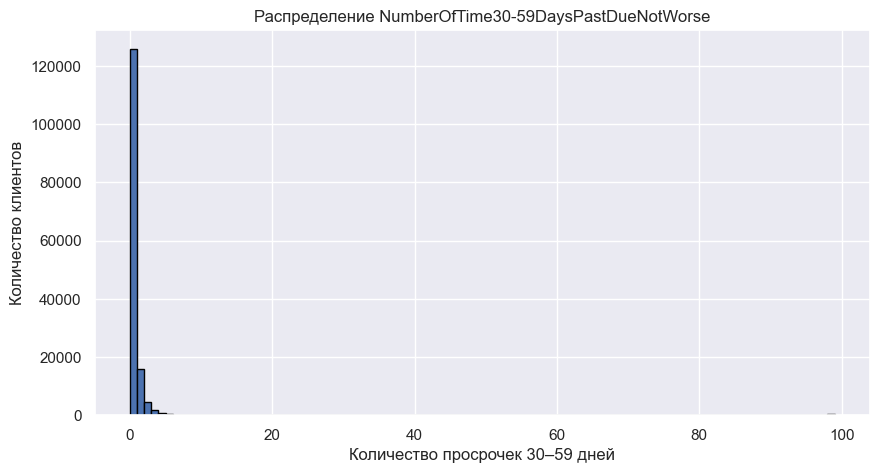

NumberOfTime30-59DaysPastDueNotWorse
0     126018
1      16033
2       4598
3       1754
4        747
5        342
6        140
7         54
8         25
9         12
10         4
11         1
12         2
13         1
96         5
98       264
Name: count, dtype: int64
NumberOfTime60-89DaysPastDueNotWorse - , Number of times borrower has been 60-89 days past due but no worse in the last 2 years.


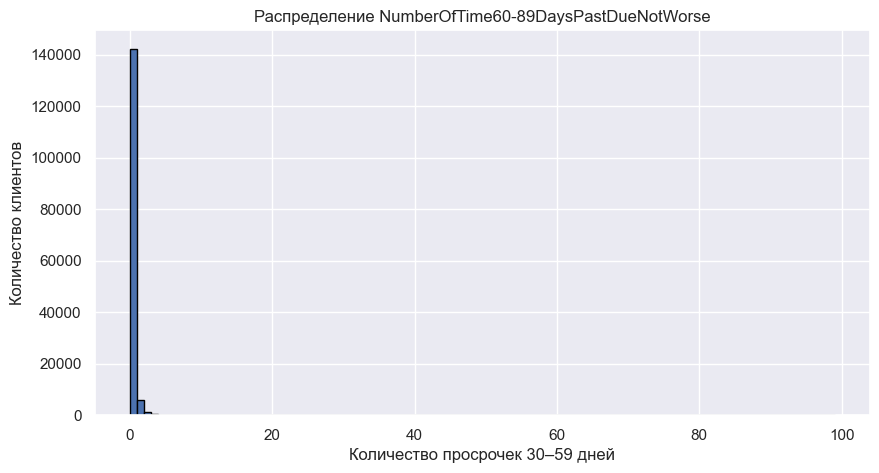

NumberOfTime60-89DaysPastDueNotWorse
0     142396
1       5731
2       1118
3        318
4        105
5         34
6         16
7          9
8          2
9          1
11         1
96         5
98       264
Name: count, dtype: int64
NumberOfTimes90DaysLate - , Number of times borrower has been 90 days or more past due.


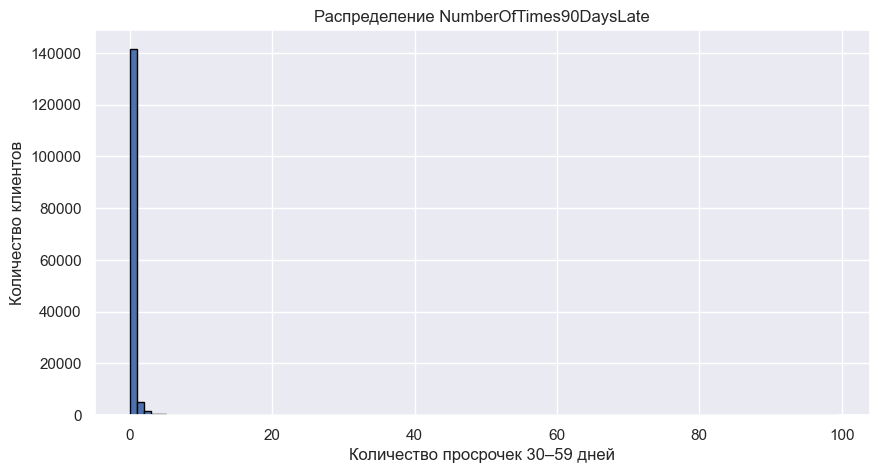

NumberOfTimes90DaysLate
0     141662
1       5243
2       1555
3        667
4        291
5        131
6         80
7         38
8         21
9         19
10         8
11         5
12         2
13         4
14         2
15         2
17         1
96         5
98       264
Name: count, dtype: int64


In [7]:
for col in ['NumberOfTime30-59DaysPastDueNotWorse','NumberOfTime60-89DaysPastDueNotWorse','NumberOfTimes90DaysLate']:
    print('{} - , {}'.format(col, Data_Dictionary[Data_Dictionary['Variable Name']==col]['Description'].iloc[0]))
    plt.figure(figsize=(10,5))
    plt.hist(df[col], bins=range(0, df[col].max()+2), edgecolor='black')
    plt.title(f"Распределение {col}")
    plt.xlabel("Количество просрочек 30–59 дней")
    plt.ylabel("Количество клиентов")
    #plt.xticks(range(0, df[col].max()+2))
    plt.show()
    print(df[col].value_counts().sort_index())
    print('=========================================')

In [8]:
print('96,98 values probably is technical, delete it')
for col in ['NumberOfTime30-59DaysPastDueNotWorse','NumberOfTime60-89DaysPastDueNotWorse','NumberOfTimes90DaysLate']:
    df.loc[df[col]>=20, col] = np.nan
    print('min: {} , max {}'.format(df[col].min(), df[col].max()))

96,98 values probably is technical, delete it
min: 0.0 , max 13.0
min: 0.0 , max 11.0
min: 0.0 , max 17.0


### Feature engineering

In [9]:
# Total debt burden - the total burden on loans and credit cards
df["TotalDebtLoad"] = df["DebtRatio"] * df["RevolvingUtilizationOfUnsecuredLines"]

# Income per dependent
df["IncomePerDependent"] = df["MonthlyIncome"] / (1 + df["NumberOfDependents"].fillna(0))

#Number of delinquencies per open loan - Reflects the frequency of delinquencies per loan
df["LatePerCredit"] = (
    df["NumberOfTime30-59DaysPastDueNotWorse"] +
    df["NumberOfTime60-89DaysPastDueNotWorse"] +
    df["NumberOfTimes90DaysLate"]
) / df["NumberOfOpenCreditLinesAndLoans"].replace(0, 1)  

#Total number of overdue payments
df["TotalLate"] = (
    df["NumberOfTime30-59DaysPastDueNotWorse"] +
    df["NumberOfTime60-89DaysPastDueNotWorse"] +
    df["NumberOfTimes90DaysLate"]
)

# Delinquency to Income Ratio
df["LateIncomeRatio"] = df["TotalLate"] / (df["IncomePerDependent"].replace(0, np.nan))


### Train Test split

In [10]:
target = 'SeriousDlqin2yrs'

X = df.drop(columns=[target])
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    stratify=y,
    random_state=42
)
print('share train = {:.2%} , train sise = {} , train sum defaults = {} , train DR = {:.2%}'.format(len(X_train)/len(df), len(X_train), y_train.sum(), y_train.sum()/len(X_train) ))
print('share test = {:.2%} , test sise = {} , test sum defaults = {} , test DR = {:.2%}'.format(len(X_test)/len(df), len(X_test), y_test.sum(), y_test.sum()/len(X_test) ))

share train = 70.00% , train sise = 105000 , train sum defaults = 7018 , train DR = 6.68%
share test = 30.00% , test sise = 45000 , test sum defaults = 3008 , test DR = 6.68%


### Binning functions

In [11]:
# =============================================================================
# Gini & KS calculation
#
# Computes Gini and KS directly from event/non-event counts per bin.
#
# Gini: area between the Lorenz curve and the diagonal.
# KS:   maximum vertical distance between cumulative bad and good rate curves.
# =============================================================================

def calc_gini_ks(event: np.ndarray, nonevent: np.ndarray) -> tuple[float, float]:
    """
    Compute Gini coefficient and KS statistic from bin-level event counts.

    Parameters
    ----------
    event    : array of bad counts per bin
    nonevent : array of good counts per bin

    Returns
    -------
    (gini, ks) : both in [0, 1]
    """
    te  = event.sum()
    tne = nonevent.sum()

    # Sort bins by non-event rate (ascending) for Lorenz curve construction
    ner = nonevent / (event + nonevent)
    idx = np.argsort(ner)
    ev  = event[idx]
    ne  = nonevent[idx]

    # Gini via trapezoidal area under the Lorenz curve
    s        = np.zeros(len(ev))
    s[1:]    = 2.0 * ne[:-1].cumsum()
    gini_val = 1.0 - np.dot(ev, ne + s) / (te * tne)

    # KS: max separation between cumulative bad and good distributions
    p_event    = event / te
    p_nonevent = nonevent / tne
    ks_val     = np.abs(p_event.cumsum() - p_nonevent.cumsum()).max()

    return gini_val, ks_val


In [12]:
# =============================================================================
# Binning visualisation
#
# Stacked bar chart: non-events (blue) + events (red) per bin.
# Overlaid line: event rate per bin (right y-axis).
# Missing bin is marked with hatching for visual distinction.
# =============================================================================

def draw_binning(table: pd.DataFrame, variable: str) -> None:
    """
    Plot a binning summary chart for a single feature.

    Parameters
    ----------
    table    : binning table returned by binning_func()
    variable : feature name (used in chart title)

    Returns
    -------
    plt drow binning distibutions
    """
    # Exclude empty bins and the totals row
    t = table[(table["Count"] != 0) & (table["Count (%)"] != 1)].copy()

    event    = t["Event"].values
    nonevent = t["Non-event"].values
    gini_val, ks_val = calc_gini_ks(event, nonevent)

    bins  = t["Bin"].values
    x_pos = np.arange(len(bins))

    fig, ax1 = plt.subplots()

    # Stacked bars: events on bottom, non-events on top
    bars_event    = ax1.bar(x_pos, event,    color="tab:red",  label="Event")
    bars_nonevent = ax1.bar(x_pos, nonevent, color="tab:blue", label="Non-event",
                            bottom=event)

    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(bins, rotation=45, ha="right")
    ax1.set_ylabel("Bin count", fontsize=12)
    ax1.set_title(f"{variable}  |  Gini={gini_val:.4f}  |  KS={ks_val:.4f}")

    # Event rate line on secondary axis
    ax2 = ax1.twinx()
    ax2.plot(x_pos, t["Event rate"].values,
             linestyle="solid", marker="o", color="black", label="Event rate")
    ax2.set_ylabel("Event rate", fontsize=13)
    ax2.xaxis.set_major_locator(mtick.MultipleLocator(1))

    # Hatch missing bin if present
    if "Missing" in bins:
        pos_missing = np.where(bins == "Missing")[0][0]
        bars_event[pos_missing].set_hatch("\\")
        bars_nonevent[pos_missing].set_hatch("\\")
        handle_missing = mpatches.Patch(hatch="\\", alpha=0.1, label="Bin missing")
        handles = [bars_nonevent[0], bars_event[0], handle_missing]
        labels  = ["Non-event", "Event", "Bin missing"]
    else:
        handles = [bars_nonevent[0], bars_event[0]]
        labels  = ["Non-event", "Event"]

    plt.legend(handles, labels,
               loc="upper center",
               bbox_to_anchor=(1.51, 1.1),
               ncol=2, fontsize=12)
    plt.tight_layout()
    plt.show()

In [13]:
# =============================================================================
# Optimal binning wrapper
#
# Wraps OptimalBinning with two modes:
#   rule=True  : user-defined splits (fixed categorical or your custom bins)
#   rule=False : automatic optimal binning with monotonicity and p-value control
#
# Missing value handling:
#   - flag_missing=True  : merge missing into the first or last bin (depending
#                          on missing_place) to avoid a standalone missing bin
#   - flag_missing=False : keep missing as a separate bin
#
# Returns binning table with WoE, Wilson CIs, Gini, KS + the split points.
# =============================================================================

def binning_func(
    df: pd.DataFrame,
    x: str,
    y: str,
    dtype: str,
    solver: str,
    user_splits: list,
    user_splits_fixed: list,
    rule: bool,
    max_n_prebins: int,
    trend: str,
    flag_missing: bool,
    missing_place: str,
    itog: bool,
) -> tuple[pd.DataFrame, np.ndarray]:
    """
    Fit OptimalBinning and return a formatted binning table with WoE and statistics.

    Parameters
    ----------
    df                : input dataframe (must contain x and y columns)
    x                 : feature name
    y                 : target name
    dtype             : "numerical" or "categorical"
    solver            : OptimalBinning solver ("cp", "mip", etc.)
    user_splits       : manual split points or category groups
    user_splits_fixed : which user_splits are fixed (not merged)
    rule              : True = use user_splits; False = automatic binning
    max_n_prebins     : maximum number of pre-bins for automatic mode
    trend             : monotonic trend constraint ("ascending", "descending", "auto")
    flag_missing      : whether to merge missing into an adjacent bin
    missing_place     : "missing_first" or "missing_last" — which end to merge into
    itog              : True = build final production table; False = exploratory

    Returns
    -------
    (binning_table, split_points)
    """
    X = df[x]
    Y = df[y]

    if rule:
        # User-defined splits — typically for categorical features
        optb = OptimalBinning(
            name=x,
            dtype=dtype,
            solver=solver,
            user_splits=user_splits,
            user_splits_fixed=user_splits_fixed,
        )
    else:
        # Automatic optimal binning with monotonicity and p-value constraints
        optb = OptimalBinning(
            name=x,
            dtype=dtype,
            solver=solver,
            max_n_prebins=max_n_prebins,
            min_prebin_size=0.05,
            max_pvalue=0.05,
            monotonic_trend=trend,
        )

    optb.fit(X, Y)

    raw   = optb.binning_table.build()[["Bin", "Event", "Non-event", "Count"]]
    spl   = optb.splits
    z_val = raw.values
    rows  = []

    if itog and flag_missing:
        # Merge the missing bin into the first or last regular bin
        missing_idx = len(z_val) - 2  # missing is second-to-last before Totals
        for i in range(len(z_val) - 3):
            merge_here = (
                (missing_place == "missing_first" and i == 0)
                or (missing_place == "missing_last" and i == len(z_val) - 4)
            )
            if merge_here:
                rows.append({
                    "Bin":   str(z_val[i, 0]) + " & missing",
                    "Bad":   z_val[i, 1] + z_val[missing_idx, 1],
                    "Good":  z_val[i, 2] + z_val[missing_idx, 2],
                    "All":   z_val[i, 3] + z_val[missing_idx, 3],
                })
            else:
                rows.append({
                    "Bin":  str(z_val[i, 0]),
                    "Bad":  z_val[i, 1],
                    "Good": z_val[i, 2],
                    "All":  z_val[i, 3],
                })

    elif itog and not flag_missing:
        # Production table without missing merge
        for i in range(len(z_val) - 3):
            rows.append({
                "Bin":  str(z_val[i, 0]),
                "Bad":  z_val[i, 1],
                "Good": z_val[i, 2],
                "All":  z_val[i, 3],
            })

    else:
        # Exploratory: keep all bins except Special and Totals
        for row in z_val:
            if str(row[0]) not in {"Special", "Totals"}:
                rows.append({
                    "Bin":  str(row[0]),
                    "Bad":  row[1],
                    "Good": row[2],
                    "All":  row[3],
                })

    z_new = pd.DataFrame(rows)

    # --- Derived metrics ---

    z_new["% DR"] = z_new["Bad"] / z_new["All"] * 100

    # WoE: log(good_rate / bad_rate) — negative for high-risk bins
    z_new["WoE"] = np.log(
        (z_new["Good"] / z_new["Good"].sum())
        / (z_new["Bad"]  / z_new["Bad"].sum())
    )

    # Wilson 90% confidence interval on the default rate
    ci_low, ci_up = sm.stats.proportion_confint(
        z_new["Bad"],
        z_new["All"],
        alpha=0.10,
        method="wilson",
    )
    z_new["Wilson Lower %"] = ci_low * 100
    z_new["Wilson Upper %"] = ci_up  * 100

    # Rename for consistency with downstream code
    bb = z_new.rename(columns={
        "All":  "Count",
        "Good": "Non-event",
        "Bad":  "Event",
    })
    bb["Event rate"] = bb["% DR"] / 100
    bb["Count (%)"]  = bb["Count"] / bb["Count"].sum()

    # Bin-level Gini and KS (excluding empty / total rows)
    t = bb[(bb["Count"] != 0) & (bb["Count (%)"] != 1)]
    gini_val, ks_val = calc_gini_ks(t["Event"].values, t["Non-event"].values)
    bb["gini"] = gini_val
    bb["ks"]   = ks_val

    return bb[["Bin", "Event", "Non-event", "Count", "% DR", "WoE",
               "Wilson Lower %", "Wilson Upper %", "gini", "ks"]], spl

In [14]:
# =============================================================================
# WoE transformation (inference)
#
# Maps a raw feature value to its WoE using the binning table and split points
# produced by binning_func(). Called via .apply() on each column after fitting.
#
# Relies on the outer `bb` and `spl` variables — make sure these are set
# in the enclosing scope before calling binning_apply().
# =============================================================================

def binning_apply(x, par_type: str, spl: np.ndarray) -> float:
    """
    Transform a single value to its WoE based on fitted bin boundaries.

    Parameters
    ----------
    x        : raw feature value (scalar)
    par_type : "categorical" or "numerical"
    spl      : split points array from binning_func()

    Returns
    -------
    WoE value (float) for the bin the value falls into
    """
    if par_type == "categorical":
        is_missing = pd.isna(x) or str(x) == "nan"

        for u in range(len(bb["Bin"])):
            bin_value = bb["Bin"][u]
            # Match non-missing value against bin label (stored as "'value'")
            if not is_missing and ("'" + str(x) + "'" in bin_value):
                return bb["WoE"][u]
            # Match missing value to Missing or merged bin
            if is_missing and (bin_value == "Missing" or "& missing" in bin_value):
                return bb["WoE"][u]

        # Fallback: treat as NaN and retry
        x = np.nan
        for u in range(len(bb["Bin"])):
            bin_value = bb["Bin"][u]
            if pd.isna(x) and (bin_value == "Missing" or "& missing" in bin_value):
                return bb["WoE"][u]

    elif par_type == "numerical":
        # Find the first split boundary that the value falls below
        for m, threshold in enumerate(spl):
            if x < threshold:
                return bb["WoE"][m]

        is_missing = pd.isna(x) or str(x) == "nan"

        # Value exceeds all splits → last regular bin or missing
        for m in range(len(bb["Bin"])):
            bin_value = bb["Bin"][m]
            if not is_missing and ", inf)" in bin_value:
                return bb["WoE"][m]
            if is_missing and (bin_value == "Missing" or "& missing" in bin_value):
                return bb["WoE"][m]

### Example of variable binning lookup logic

In [15]:
name = 'LateIncomeRatio'
par_type = 'numerical'
target = 'SeriousDlqin2yrs'
z = X_train.copy()
z[target] = y_train
print('count missing = {}\n'.format(len(z[pd.isna(z[name])])))
#z = z[pd.isna(z[name])==False].reset_index(drop=True)
#z[name] = z[name].fillna(0)
user_splits = []
user_splits_fixed = []
chet_1 = 20
trend = 'auto'
bb, spl = binning_func(z,name,target,par_type,'cp',
                       user_splits,user_splits_fixed,False,chet_1,trend,True,'missing_last',True)
print(name)
display(bb)
print('cut offs splits ', spl)

#print(bb['Bin'][0])
#print(bb['Bin'][1])
#drow_binning(bb, name)

count missing = 21963

LateIncomeRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.00)",1961,63480,65441,2.996592,0.840965,2.888896,3.108176,0.371689,0.36845
1,"[0.00, 0.00)",1102,7959,9061,12.162013,-0.659129,11.608494,12.738121,0.371689,0.36845
2,"[0.00, inf) & missing",3955,26543,30498,12.968063,-0.732520,12.654922,13.287775,0.371689,0.36845


cut offs splits  [2.49532995e-05 5.24900126e-04]


### Modeling

In [16]:
# =============================================================================
# Config & constants
# =============================================================================

TARGET = "SeriousDlqin2yrs"

# PSI threshold: features with PSI >= this are excluded
PSI_THRESHOLD = 0.05

# Maximum number of features to select via RFE
MAX_FEATURES = 16

# Safety cap on backward stepwise iterations
MAX_ITER = 10_930

# Cross-validation settings
N_FOLDS = 3
RANDOM_STATE = 42

# Expected monotonic trend per feature (used to control binning direction
# and missing value placement)
TREND_MAP = {
    "RevolvingUtilizationOfUnsecuredLines": "ascending",
    "age": "descending",
    "NumberOfTime30-59DaysPastDueNotWorse": "ascending",
    "DebtRatio": "ascending",
    "MonthlyIncome": "descending",
    "NumberOfOpenCreditLinesAndLoans": "ascending",
    "NumberOfTimes90DaysLate": "ascending",
    "NumberRealEstateLoansOrLines": "ascending",
    "NumberOfTime60-89DaysPastDueNotWorse": "ascending",
    "NumberOfDependents": "ascending",
    "TotalDebtLoad": "ascending",
    "IncomePerDependent": "descending",
    "LatePerCredit": "ascending",
    "TotalLate": "ascending",
    "LateIncomeRatio": "ascending",
}

In [17]:
# =============================================================================
# Binning helper
# =============================================================================

def binning_rule(z, y, name, obj_list, chet_1=10, trend="auto"):
    """
    Bin a single feature with monotonicity enforcement.

    Iteratively reduces the number of bins until the Wilson confidence
    intervals for adjacent bins no longer overlap (monotone WoE).

    Returns: (binning_table, splits, par_type)
    """
    par_type = "categorical" if name in obj_list else "numerical"

    # For numerical features, missing values go to the riskier end
    if par_type == "numerical" and trend == "descending":
        missing_placement = "missing_first"
    else:
        missing_placement = "missing_last"

    z[TARGET] = y
    user_splits = []
    user_splits_fixed = []
    monotone = False

    while not monotone:
        # CLIENT_SEX_y requires fixed categorical splits
        if name in {"your_feature"}:
            par_type = "categorical"
            user_splits = [["female"], ["male"]]
            user_splits_fixed = [True, True]
            bb, spl = binning_func(
                z, name, TARGET, par_type, "cp",
                user_splits, user_splits_fixed,
                True, chet_1, "auto", False, "missing_last", True,
            )
        else:
            try:
                bb, spl = binning_func(
                    z, name, TARGET, par_type, "cp",
                    user_splits, user_splits_fixed,
                    False, chet_1, trend, True, missing_placement, True,
                )
            except Exception:
                # Fallback: disable monotonicity enforcement
                bb, spl = binning_func(
                    z, name, TARGET, par_type, "cp",
                    user_splits, user_splits_fixed,
                    False, chet_1, trend, False, missing_placement, False,
                )

        # Check monotonicity via Wilson CI overlap between adjacent bins
        non_missing = (
            bb[bb["Bin"] != "Missing"][["Bin", "Wilson Lower %", "Wilson Upper %"]]
            .sort_values("Wilson Lower %")
            .reset_index(drop=True)
        )
        chet_1 = len(non_missing)

        monotone = True
        for i in range(1, len(non_missing)):
            # Skip monotonicity check for features where any ordering is acceptable
            if name in ['your_features']:
                break
            if non_missing["Wilson Lower %"][i] < non_missing["Wilson Upper %"][i - 1]:
                monotone = False
                break

        chet_1 -= 1
        if chet_1 <= 1:
            # Cannot reduce further — accept current binning
            monotone = True

    return bb, spl, par_type

In [18]:
# =============================================================================
# CV setup & storage
# =============================================================================

X_train_for_model = X_train.copy()
X_test_for_model  = X_test.copy()
df_all            = df.copy()

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=RANDOM_STATE)

# OOF matrix: rows = train samples, cols = folds
oof_level1  = np.zeros((len(X_train_for_model), N_FOLDS))
# Test predictions per fold (averaged later for stacking)
test_level1 = np.zeros((len(X_test_for_model), N_FOLDS))

# Gini summary across folds
df_appl = pd.DataFrame(index=["gini_train", "gini_valid", "gini_test", "gini_all"])

table_binning_train = pd.DataFrame()  # stores all binning tables for inspection
log_exclude         = []              # audit log: which features were dropped and why
names_f             = []              # all features that passed PSI filter (any fold)

# Detect categorical features by dtype
obj_list = [c for c in X_train_for_model.columns if X_train_for_model[c].dtype == object]

# Storage for post-CV validation
fold_val_indices     = []   # val_idx per fold — needed for correct per-fold PSI
vif_per_fold         = []   # VIF dataframes per fold — averaged in validation cell
coef_per_fold        = []   # model coefficients per fold — used for cross-fold stability analysis
best_params_records  = []  # all best parametrs on each fold for logistic regression

In [19]:
# =============================================================================
# Main CV loop
# =============================================================================

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_for_model, y_train)):
    print(f"\n{'='*60}")
    print(f"  Fold {fold + 1} / {N_FOLDS}  —  {datetime.now():%Y-%m-%d %H:%M:%S}")
    print(f"{'='*60}")

    # Fresh copies for each fold so binning transforms don't bleed across folds
    X_test_for_model = X_test.copy()
    df_all           = df.copy()

    X_tr  = X_train_for_model.iloc[train_idx].copy()
    X_val = X_train_for_model.iloc[val_idx].copy()
    y_tr  = y_train.iloc[train_idx].copy()
    y_val = y_train.iloc[val_idx].copy()

    list_throuth_cols = []  # features that passed binning + PSI check this fold

    # ------------------------------------------------------------------
    # Step 1: Binning
    # ------------------------------------------------------------------
    for name, trend in TREND_MAP.items():
        print(f"  Binning: {name}")

        bb, spl, par_type = binning_rule(
            z=X_tr.copy(), y=y_tr.copy(),
            name=name, obj_list=obj_list,
            chet_1=20, trend=trend,
        )

        display(bb)
        bb["name"] = name
        table_binning_train = pd.concat([table_binning_train, bb], ignore_index=True)

        # Apply the learned splits to all datasets
        for df_part in (X_tr, X_val, X_test_for_model, df_all):
            df_part[name] = df_part[name].apply(lambda x: binning_apply(x, par_type, spl))

        # Compute default rate distribution on train and validation
        dist_train = (
            pd.concat([X_tr, y_tr], axis=1)
            .groupby(name)
            .agg(
                persents=(TARGET, lambda x: len(x) / len(X_tr[name])),
                dr=(TARGET, lambda x: x.sum() / len(x)),
            )
        )
        dist_val = (
            pd.concat([X_val, y_val], axis=1)
            .groupby(name)
            .agg(
                persents=(TARGET, lambda x: len(x) / len(X_val[name])),
                dr=(TARGET, lambda x: x.sum() / len(x)),
            )
        )

        # Reject features that collapsed into a single all-encompassing bin
        has_single_bin = any(b == "(-inf, inf)" for b in bb["Bin"])

        # PSI measures stability of the default rate distribution between splits
        psi = (
            (dist_train["dr"] - dist_val["dr"])
            * np.log(dist_train["dr"] / dist_val["dr"])
        ).sum()

        if not has_single_bin and psi < PSI_THRESHOLD:
            names_f.append(name)
            list_throuth_cols.append(name)
        elif psi >= PSI_THRESHOLD:
            print(f"    [SKIP] PSI={psi:.4f} >= {PSI_THRESHOLD}")
        else:
            print(f"    [SKIP] Could not bin feature")

        print()

    print(f"\n  Binning done — {len(list_throuth_cols)} features passed — {datetime.now():%H:%M:%S}")

    cols1 = list_throuth_cols

    # ------------------------------------------------------------------
    # Step 2: Scale for feature selection
    # ------------------------------------------------------------------
    scaler = StandardScaler()
    scaler.fit(X_tr[cols1])

    X_v = pd.DataFrame(scaler.transform(X_tr[cols1]), columns=cols1)
    X_v["intersept"] = 1

    Y_v = y_tr.reset_index(drop=True)

    # ------------------------------------------------------------------
    # Step 3: Feature selection — RFE + backward stepwise
    #
    # Strategy:
    #   a) RFE narrows candidates to `num_f` features.
    #   b) Statsmodels Logit provides exact p-values.
    #   c) Features with p > 0.05 are removed one at a time.
    #   d) If two features are name-similar or correlated (|r| > 0.5),
    #      the one with lower univariate Gini is dropped.
    #   e) If p-value is NaN (model instability), the weakest feature
    #      by univariate Gini is removed.
    #   f) `num_f` decreases by 1 when the active pool runs out.
    # ------------------------------------------------------------------
    print(f"\n  Searching {MAX_FEATURES} features — {datetime.now():%H:%M:%S}")

    num_f       = MAX_FEATURES
    cols_remove = []
    iterr       = 0
    cols1       = list(X_v.columns)

    while (len(cols1) > 0) and (num_f > 3):
        # Reduce target feature count when active pool is exhausted
        if (len(cols1) <= 4) or (len(cols1) < num_f):
            num_f -= 1
            cols_remove = []
            print(f"  Searching {num_f} features — {datetime.now():%H:%M:%S}")

        active_cols = [c for c in X_v.columns if c not in cols_remove]
        cols1       = active_cols

        # --- RFE: coarse pre-selection ---
        model = LogisticRegression(solver="lbfgs", random_state=RANDOM_STATE, max_iter=1500)
        rfe   = RFE(model, n_features_to_select=num_f, verbose=0)
        rfe.fit(X_v[cols1], Y_v)
        cols1 = list(X_v[cols1].columns[rfe.support_])

        if "intersept" not in cols1:
            cols1.append("intersept")

        # --- Statsmodels Logit for p-values ---
        logit_model = sm.Logit(Y_v.astype(float), X_v[cols1].astype(float))
        clf         = logit_model.fit(method="bfgs", disp=False)
        p                  = pd.Series(clf.pvalues.values, index=cols1)
        pmax               = p.max()
        feature_with_p_max = p.idxmax()

        # --- Check for correlated / name-similar feature pairs ---
        # For each pair, compare univariate Gini and mark the weaker one
        y_gini_1 = 0
        y_gini_2 = 0
        i_2, k_2 = None, None
        next_    = True

        try:
            list_cols = cols1.to_list()
        except AttributeError:
            list_cols = list(cols1)

        for i_2 in list_cols:
            list_cols_1 = [c for c in list_cols if c != i_2]
            for k_2 in list_cols_1:
                name_similar = difflib.SequenceMatcher(None, i_2, k_2).ratio() >= 0.65
                corr_val     = abs(X_v[[i_2, k_2]].corr().iloc[1, 0])

                if name_similar or corr_val > 0.5:
                    # Compute univariate Gini for each to decide which to keep
                    for col, is_first in ((i_2, True), (k_2, False)):
                        lm   = sm.Logit(Y_v.astype(float), X_v[col].astype(float))
                        pred = lm.fit(method="bfgs", disp=False).predict(X_v[col])
                        gini = 2 * roc_auc_score(Y_v, pred) - 1
                        if is_first:
                            y_gini_1 = gini
                        else:
                            y_gini_2 = gini
                    next_ = False
                    break
            if not next_:
                break

        # --- Decision: what to remove this iteration ---
        if pmax > 0.05:
            # p-value too high — remove the worst feature
            cols_remove.append(feature_with_p_max)
            log_exclude.append(
                f"n_features={num_f} | fold={fold} | "
                f"drop={feature_with_p_max}: high p-value={pmax:.4f}"
            )

        elif i_2 and k_2 and y_gini_1 > y_gini_2:
            # i_2 has better Gini — drop k_2
            cols_remove.append(k_2)
            log_exclude.append(
                f"n_features={num_f} | fold={fold} | "
                f"drop={k_2}: corr={abs(X_v[[i_2, k_2]].corr().iloc[1, 0]):.2f} "
                f"({i_2} gini={y_gini_1:.2%} > {k_2} gini={y_gini_2:.2%})"
            )

        elif i_2 and k_2 and y_gini_1 < y_gini_2:
            # k_2 has better Gini — drop i_2
            cols_remove.append(i_2)
            log_exclude.append(
                f"n_features={num_f} | fold={fold} | "
                f"drop={i_2}: corr={abs(X_v[[i_2, k_2]].corr().iloc[1, 0]):.2f} "
                f"({i_2} gini={y_gini_1:.2%} < {k_2} gini={y_gini_2:.2%})"
            )

        elif pd.isna(pmax):
            # Model instability — remove the feature with lowest univariate Gini
            gini_per_col = []
            for c in cols1:
                if c == "intersept":
                    gini_per_col.append(1.0)
                else:
                    lm   = sm.Logit(Y_v.astype(float), X_v[c].astype(float))
                    pred = lm.fit(method="bfgs", disp=False).predict(X_v[c])
                    gini_per_col.append(2 * roc_auc_score(Y_v, pred) - 1)

            weakest = cols1[int(np.argmin(gini_per_col))]
            cols_remove.append(weakest)
            log_exclude.append(
                f"n_features={num_f} | fold={fold} | "
                f"drop={weakest}: NaN p-value (model instability)"
            )

        else:
            # All checks passed — selection is complete
            break

        iterr += 1
        if iterr >= MAX_ITER:
            print("  [WARNING] Max iterations reached — forcing exit.")
            break

    # Finalize selected features (intercept is re-added below after scaling)
    cols1 = set(cols1)
    try:
        cols1 = cols1.to_list()
    except AttributeError:
        cols1 = list(cols1)
    cols1 = [c for c in cols1 if c != "intersept"]

    print(f"  Selected features ({len(cols1)}): {cols1}")

    # ------------------------------------------------------------------
    # Step 4: Final scaling on selected features only
    # ------------------------------------------------------------------
    scaler = StandardScaler()
    scaler.fit(X_tr[cols1])

    X_tr             = pd.DataFrame(scaler.transform(X_tr[cols1]),             columns=cols1)
    X_val            = pd.DataFrame(scaler.transform(X_val[cols1]),            columns=cols1)
    X_test_for_model = pd.DataFrame(scaler.transform(X_test_for_model[cols1]), columns=cols1)
    df_all           = pd.DataFrame(scaler.transform(df_all[cols1]),           columns=cols1)

    # Add intercept column required by statsmodels
    for df_part in (X_tr, X_val, X_test_for_model, df_all):
        df_part["intersept"] = 1

    cols1 = X_tr.columns

    # ------------------------------------------------------------------
    # Step 5a: Hyperparameter search (GridSearchCV) on selected features
    #
    # We search over regularisation strength C (= 1 / lambda).
    # Cross-validation is performed on the current fold's train split only
    # (inner CV), so no leakage from validation or test sets.
    #
    # Metric: ROC-AUC (equivalent to Gini ranking, supported natively).
    # ------------------------------------------------------------------
    inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)

    grid_search = GridSearchCV(
        estimator=LogisticRegression(
            penalty="l2",
            solver="lbfgs",
            max_iter=1500,
            random_state=RANDOM_STATE,
        ),
        param_grid={"C": [0.01, 0.05, 0.1, 0.5, 1.0, 5.0, 10.0]},
        scoring="roc_auc",
        cv=inner_cv,
        n_jobs=-1,
        refit=True,
    )

    # Fit on train features without the intercept column (sklearn adds its own)
    train_cols_no_intercept = [c for c in cols1 if c != "intersept"]
    grid_search.fit(
        X_tr[train_cols_no_intercept].astype(float),
        y_tr.reset_index(drop=True).astype(int),
    )

    best_C      = grid_search.best_params_["C"]
    best_cv_auc = grid_search.best_score_
    print(f"  Best C={best_C}  |  inner CV AUC={best_cv_auc:.4f}")

    best_params_records.append({
        "fold": fold, "best_C": best_C, "cv_auc": best_cv_auc
    })

    # ------------------------------------------------------------------
    # Step 5b: Extract sklearn coefficients as start_params for sm.Logit
    #
    # sm.Logit is fitted without regularisation to get valid standard errors
    # and p-values in summary(). Passing sklearn coefficients as start_params
    # gives the optimiser a warm start close to the regularised solution,
    # which improves convergence speed and numerical stability.
    #
    # Coefficient order: [intercept, feat_1, ..., feat_n] in sklearn,
    # but sm.Logit expects [feat_1, ..., feat_n, intercept] — we reorder.
    # ------------------------------------------------------------------
    sklearn_intercept = grid_search.best_estimator_.intercept_[0]
    sklearn_coefs     = grid_search.best_estimator_.coef_[0]

    # sm.Logit column order: features first, then intercept
    start_params = np.append(sklearn_coefs, sklearn_intercept)

    # ------------------------------------------------------------------
    # Step 5c: Fit sm.Logit with warm start for full summary output
    # ------------------------------------------------------------------
    logit_model = sm.Logit(
        y_tr.reset_index(drop=True).astype(float),
        X_tr[cols1].astype(float),
    )
    clf = logit_model.fit(
        method="bfgs",
        start_params=start_params,
        disp=False,
    )
    print(clf.summary())

    # ------------------------------------------------------------------
    # Step 6: Predictions & Gini
    # ------------------------------------------------------------------
    y_pred_train = clf.predict(X_tr[cols1])
    y_pred_valid = clf.predict(X_val[cols1])
    y_pred_test  = clf.predict(X_test_for_model[cols1])
    y_pred_all   = clf.predict(df_all[cols1])

    gini_train = 2 * roc_auc_score(y_tr,       y_pred_train) - 1
    gini_valid = 2 * roc_auc_score(y_val,       y_pred_valid) - 1
    gini_test  = 2 * roc_auc_score(y_test,      y_pred_test)  - 1
    gini_all   = 2 * roc_auc_score(df[TARGET],  y_pred_all)   - 1

    print(f"  Train={gini_train:.4f} | Valid={gini_valid:.4f} | Test={gini_test:.4f} | All={gini_all:.4f}")

    df_appl[f"model_{fold}"] = [gini_train, gini_valid, gini_test, gini_all]

    # ------------------------------------------------------------------
    # Step 7: Store OOF / test predictions + per-fold metadata for validation
    # ------------------------------------------------------------------
    oof_level1[val_idx, fold] = y_pred_valid
    test_level1[:, fold]      = y_pred_test

    # Save val_idx — used for per-fold PSI breakdown
    fold_val_indices.append(val_idx)

    # --- VIF for this fold ---
    # Computed on the scaled train matrix of the current fold (no intercept column).
    # Storing per fold lets us check consistency — a feature with high VIF in every
    # fold is a real multicollinearity problem; high VIF in one fold only is noise.
    vif_cols_fold = [c for c in X_tr.columns if c != "intersept"]
    vif_fold_df = pd.DataFrame({
        "feature": vif_cols_fold,
        "VIF": [
            variance_inflation_factor(X_tr[vif_cols_fold].values, i)
            for i in range(len(vif_cols_fold))
        ],
        "fold": fold,
    })
    vif_per_fold.append(vif_fold_df)

    # --- Coefficients for this fold ---
    # Store feature names alongside values so we can align across folds even if
    # different folds selected different features (union of all features used).
    coef_per_fold.append(
        pd.Series(clf.params.values, index=X_tr[cols1].columns, name=f"fold_{fold}")
    )



  Fold 1 / 3  —  2026-02-20 15:54:28
  Binning: RevolvingUtilizationOfUnsecuredLines


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.11)",597,31120,31717,1.882271,1.317460,1.760799,2.011952,0.547653,0.45312
1,"[0.11, 0.19)",158,5490,5648,2.797450,0.911859,2.458519,3.181582,0.547653,0.45312
2,"[0.19, 0.30)",218,5828,6046,3.605690,0.649705,3.231606,4.021277,0.547653,0.45312
3,"[0.30, 0.40)",222,3843,4065,5.461255,0.215102,4.904122,6.077635,0.547653,0.45312
4,"[0.40, 0.53)",281,3889,4170,6.738609,-0.008677,6.127700,7.405619,0.547653,0.45312
5,"[0.53, 0.68)",390,3590,3980,9.798995,-0.416468,9.050943,10.601666,0.547653,0.45312
6,"[0.68, 0.94)",923,5287,6210,14.863124,-0.890852,14.135931,15.620920,0.547653,0.45312
7,"[0.94, inf) & missing",1890,6274,8164,23.150416,-1.436392,22.391538,23.927085,0.547653,0.45312



  Binning: age


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 38.50) & missing",1451,12099,13550,10.708487,-0.515359,10.279359,11.153303,0.256146,0.200286
1,"[38.50, 43.50)",643,6668,7311,8.794966,-0.297299,8.265261,9.355157,0.256146,0.200286
2,"[43.50, 55.50)",1525,18673,20198,7.550253,-0.131145,7.250127,7.861749,0.256146,0.200286
3,"[55.50, 63.50)",637,12325,12962,4.914365,0.326386,4.611357,5.236190,0.256146,0.200286
4,"[63.50, inf)",423,15556,15979,2.647224,0.968600,2.446213,2.864269,0.256146,0.200286



  Binning: NumberOfTime30-59DaysPastDueNotWorse


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",2383,56432,58815,4.051687,0.528447,3.920060,4.187542,0.370206,0.354621
1,"[0.50, 1.50)",1110,6372,7482,14.835605,-0.888676,14.172392,15.524241,0.370206,0.354621
2,"[1.50, inf) & missing",1186,2517,3703,32.028085,-1.883748,30.780409,33.302005,0.370206,0.354621



  Binning: DebtRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.42)",2265,36366,38631,5.863167,0.139830,5.669631,6.062885,0.07265,0.07265
1,"[0.42, inf) & missing",2414,28955,31369,7.695496,-0.151771,7.451610,7.946678,0.07265,0.07265



  Binning: MonthlyIncome


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 4719.00) & missing",2850,34687,37537,7.592509,-0.137183,7.370676,7.820454,0.09451,0.08566
1,"[4719.00, 6616.50)",807,10771,11578,6.970116,-0.044940,6.590823,7.369515,0.09451,0.08566
2,"[6616.50, inf)",1022,19863,20885,4.893464,0.330868,4.653713,5.144901,0.09451,0.08566



  Binning: NumberOfOpenCreditLinesAndLoans


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, inf)",4679,65321,70000,6.684286,0.0,6.530685,6.841234,0.0,0.0
1,Missing,0,0,0,NaN,NaN,NaN,NaN,0.0,0.0
2,,4679,65321,70000,6.684286,0.0,6.530685,6.841234,0.0,0.0


    [SKIP] Could not bin feature

  Binning: NumberOfTimes90DaysLate


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",3032,63039,66071,4.589003,0.398302,4.456952,4.724772,0.317063,0.317063
1,"[0.50, inf) & missing",1647,2282,3929,41.919063,-2.310132,40.630239,43.219009,0.317063,0.317063



  Binning: NumberRealEstateLoansOrLines


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 2.50)",4267,61117,65384,6.526061,0.025650,6.368976,6.686745,0.023694,0.023694
1,"[2.50, inf) & missing",412,4204,4616,8.925477,-0.313461,8.259067,9.640008,0.023694,0.023694



  Binning: NumberOfTime60-89DaysPastDueNotWorse


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, inf)",4618,65262,69880,6.608472,0.012219,6.455565,6.764738,0.0091,0.006067
1,Missing,61,59,120,50.833333,-2.669566,43.391503,58.238416,0.0091,0.006067
2,,4679,65321,70000,6.684286,0.000000,6.530685,6.841234,0.0091,0.006067


    [SKIP] Could not bin feature

  Binning: NumberOfDependents


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",2391,38251,40642,5.883077,0.136229,5.694008,6.078018,0.074578,0.074578
1,"[0.50, inf) & missing",2288,27070,29358,7.793446,-0.165481,7.539977,8.054695,0.074578,0.074578



  Binning: TotalDebtLoad


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.03)",908,28451,29359,3.092748,0.808465,2.930831,3.263310,0.354062,0.292294
1,"[0.03, 0.13)",734,13565,14299,5.133226,0.280510,4.838076,5.445351,0.354062,0.292294
2,"[0.13, 0.32)",1019,10706,11725,8.690832,-0.284247,8.272389,9.128334,0.354062,0.292294
3,"[0.32, 1.76)",1429,9688,11117,12.854187,-0.722316,12.341080,13.385370,0.354062,0.292294
4,"[1.76, inf) & missing",589,2911,3500,16.828571,-1.038403,15.814111,17.894276,0.354062,0.292294



  Binning: IncomePerDependent


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 1825.17) & missing",2095,24550,26645,7.862638,-0.175071,7.595677,8.138156,0.071909,0.071909
1,"[1825.17, inf)",2584,40771,43355,5.960097,0.122403,5.775810,6.149880,0.071909,0.071909



  Binning: LatePerCredit


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.02)",1541,54287,55828,2.760264,0.925624,2.648482,2.876624,0.539787,0.501736
1,"[0.02, 0.11)",401,3602,4003,10.017487,-0.440946,9.263752,10.825231,0.539787,0.501736
2,"[0.11, 0.21)",481,3042,3523,13.653137,-0.791826,12.729481,14.632576,0.539787,0.501736
3,"[0.21, inf) & missing",2256,4390,6646,33.945230,-1.970493,32.996528,34.906999,0.539787,0.501736



  Binning: TotalLate


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",1541,54286,55827,2.760313,0.925606,2.648529,2.876675,0.539035,0.501721
1,"[0.50, 1.50)",975,7063,8038,12.129883,-0.656041,11.543625,12.741626,0.539035,0.501721
2,"[1.50, inf) & missing",2163,3972,6135,35.256724,-2.028456,34.260105,36.266340,0.539035,0.501721



  Binning: LateIncomeRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.00)",2012,47495,49507,4.064072,0.525266,3.920594,4.212570,0.297095,0.297095
1,"[0.00, inf) & missing",2667,17826,20493,13.014200,-0.736525,12.632481,13.405684,0.297095,0.297095




  Binning done — 13 features passed — 15:55:14

  Searching 16 features — 15:55:14
  Searching 15 features — 15:55:14
  Searching 14 features — 15:55:15
  Searching 13 features — 15:55:16
  Searching 12 features — 15:55:18
  Searching 11 features — 15:55:20
  Searching 10 features — 15:55:23
  Searching 9 features — 15:55:26
  Selected features (7): ['NumberOfDependents', 'age', 'LatePerCredit', 'DebtRatio', 'RevolvingUtilizationOfUnsecuredLines', 'LateIncomeRatio', 'NumberRealEstateLoansOrLines']
  Best C=0.5  |  inner CV AUC=0.8491
                           Logit Regression Results                           
Dep. Variable:       SeriousDlqin2yrs   No. Observations:                70000
Model:                          Logit   Df Residuals:                    69992
Method:                           MLE   Df Model:                            7
Date:                Fri, 20 Feb 2026   Pseudo R-squ.:                  0.2393
Time:                        15:55:34   Log-Likelihood:        

,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.06)",402,24003,24405,1.647203,1.453253,1.518448,1.786678,0.559768,0.467208
1,"[0.06, 0.22)",363,14258,14621,2.482730,1.034441,2.279696,2.703347,0.559768,0.467208
2,"[0.22, 0.32)",195,5005,5200,3.750000,0.608964,3.340144,4.207958,0.559768,0.467208
3,"[0.32, 0.49)",368,5792,6160,5.974026,0.119921,5.496387,6.490321,0.559768,0.467208
4,"[0.49, 0.70)",558,5042,5600,9.964286,-0.435030,9.325134,10.642104,0.559768,0.467208
5,"[0.70, 0.96)",976,5172,6148,15.875081,-0.968677,15.123493,16.656691,0.559768,0.467208
6,"[0.96, inf) & missing",1817,6049,7866,23.099415,-1.433523,22.327088,23.890241,0.559768,0.467208



  Binning: age


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 33.50) & missing",891,7014,7905,11.271347,-0.572910,10.699494,11.869702,0.263821,0.201621
1,"[33.50, 38.50)",539,5015,5554,9.704717,-0.405756,9.070848,10.377826,0.263821,0.201621
2,"[38.50, 47.50)",1202,12808,14010,8.579586,-0.270146,8.198348,8.976819,0.263821,0.201621
3,"[47.50, 53.50)",780,9626,10406,7.495676,-0.123300,7.082043,7.931404,0.263821,0.201621
4,"[53.50, 57.50)",402,6157,6559,6.128983,0.092664,5.659680,6.634464,0.263821,0.201621
5,"[57.50, 62.50)",388,7572,7960,4.874372,0.334978,4.492487,5.286922,0.263821,0.201621
6,"[62.50, 66.50)",199,5332,5531,3.597903,0.651948,3.208164,4.033015,0.263821,0.201621
7,"[66.50, inf)",278,11797,12075,2.302277,1.111750,2.088239,2.537685,0.263821,0.201621



  Binning: NumberOfTime30-59DaysPastDueNotWorse


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",2357,56327,58684,4.016427,0.537555,3.885216,4.151878,0.374254,0.358571
1,"[0.50, 1.50)",1132,6449,7581,14.932067,-0.896290,14.271284,15.617871,0.374254,0.358571
2,"[1.50, inf) & missing",1190,2545,3735,31.860776,-1.876052,30.620259,33.127554,0.374254,0.358571



  Binning: DebtRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.02)",317,5865,6182,5.127790,0.281627,4.685682,5.609158,0.08127,0.070836
1,"[0.02, 0.40)",1910,29852,31762,6.013475,0.112919,5.797783,6.236661,0.08127,0.070836
2,"[0.40, 0.51)",431,5795,6226,6.922583,-0.037586,6.411928,7.470660,0.08127,0.070836
3,"[0.51, inf) & missing",2021,23809,25830,7.824235,-0.169758,7.553782,8.103523,0.08127,0.070836



  Binning: MonthlyIncome


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 3332.50) & missing",2002,25153,27155,7.372491,-0.105399,7.115873,7.637603,0.108032,0.09079
1,"[3332.50, 5566.50)",1274,14651,15925,8.000000,-0.193882,7.653481,8.360788,0.108032,0.09079
2,"[5566.50, 9941.50)",1008,16511,17519,5.753753,0.159829,5.471139,6.050031,0.108032,0.09079
3,"[9941.50, inf)",395,9006,9401,4.201681,0.490531,3.874297,4.555417,0.108032,0.09079



  Binning: NumberOfOpenCreditLinesAndLoans


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, inf)",4679,65321,70000,6.684286,0.0,6.530685,6.841234,0.0,0.0
1,Missing,0,0,0,NaN,NaN,NaN,NaN,0.0,0.0
2,,4679,65321,70000,6.684286,0.0,6.530685,6.841234,0.0,0.0


    [SKIP] Could not bin feature

  Binning: NumberOfTimes90DaysLate


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",3036,63011,66047,4.596727,0.396539,4.464545,4.732628,0.31578,0.31578
1,"[0.50, inf) & missing",1643,2310,3953,41.563370,-2.295505,40.280245,42.858035,0.31578,0.31578



  Binning: NumberRealEstateLoansOrLines


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 2.50)",4275,61016,65291,6.547610,0.022123,6.390169,6.708652,0.020438,0.020438
1,"[2.50, inf) & missing",404,4305,4709,8.579316,-0.270112,7.931580,9.274621,0.020438,0.020438



  Binning: NumberOfTime60-89DaysPastDueNotWorse


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, inf)",4613,65268,69881,6.601222,0.013394,6.448395,6.757409,0.009971,0.006647
1,Missing,66,53,119,55.462185,-2.855592,47.929478,62.752041,0.009971,0.006647
2,,4679,65321,70000,6.684286,0.000000,6.530685,6.841234,0.009971,0.006647


    [SKIP] Could not bin feature

  Binning: NumberOfDependents


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",2382,37948,40330,5.906273,0.132047,5.716129,6.102333,0.077937,0.071863
1,"[0.50, 1.50)",892,11438,12330,7.234388,-0.084999,6.859954,7.627585,0.077937,0.071863
2,"[1.50, inf) & missing",1405,15935,17340,8.102653,-0.207749,7.768299,8.450079,0.077937,0.071863



  Binning: TotalDebtLoad


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.02)",648,22786,23434,2.765213,0.923782,2.594402,2.946929,0.374863,0.29859
1,"[0.02, 0.07)",494,11753,12247,4.033641,0.533099,3.751220,4.336366,0.374863,0.29859
2,"[0.07, 0.10)",279,4803,5082,5.489965,0.209555,4.987681,6.039616,0.374863,0.29859
3,"[0.10, 0.16)",349,4705,5054,6.905421,-0.034920,6.341549,7.515409,0.374863,0.29859
4,"[0.16, 0.25)",587,6224,6811,8.618411,-0.275086,8.075387,9.194299,0.374863,0.29859
5,"[0.25, 0.41)",652,5322,5974,10.913960,-0.536669,10.267992,11.595316,0.374863,0.29859
6,"[0.41, 1.74)",1057,6813,7870,13.430750,-0.772831,12.811076,14.075559,0.374863,0.29859
7,"[1.74, inf) & missing",613,2915,3528,17.375283,-1.076969,16.351126,18.449441,0.374863,0.29859



  Binning: IncomePerDependent


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 2280.17) & missing",2512,29119,31631,7.941576,-0.185918,7.695092,8.195255,0.113828,0.091084
1,"[2280.17, 5561.25)",1545,22603,24148,6.398045,0.046830,6.143867,6.661993,0.113828,0.091084
2,"[5561.25, inf)",622,13599,14221,4.373813,0.448582,4.100300,4.664684,0.113828,0.091084



  Binning: LatePerCredit


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.03)",1526,54205,55731,2.738153,0.933894,2.626722,2.854172,0.54567,0.503687
1,"[0.03, 0.13)",488,4379,4867,10.026710,-0.441969,9.340606,10.757233,0.54567,0.503687
2,"[0.13, 0.26)",607,3204,3811,15.927578,-0.972603,14.976785,16.926715,0.54567,0.503687
3,"[0.26, inf) & missing",2058,3533,5591,36.809158,-2.095816,35.754843,37.876232,0.54567,0.503687



  Binning: TotalLate


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",1526,54199,55725,2.738448,0.933783,2.627005,2.854480,0.541065,0.503595
1,"[0.50, 1.50)",980,7089,8069,12.145247,-0.657482,11.559761,12.756111,0.541065,0.503595
2,"[1.50, inf) & missing",2173,4033,6206,35.014502,-2.017827,34.025241,36.016823,0.541065,0.503595



  Binning: LateIncomeRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.00)",1312,42254,43566,3.011523,0.835917,2.879732,3.149149,0.371342,0.366465
1,"[0.00, 0.00)",702,5252,5954,11.790393,-0.623798,11.120229,12.495267,0.371342,0.366465
2,"[0.00, inf) & missing",2665,17815,20480,13.012695,-0.736392,12.630876,13.404286,0.371342,0.366465




  Binning done — 13 features passed — 15:56:18

  Searching 16 features — 15:56:18
  Searching 15 features — 15:56:18
  Searching 14 features — 15:56:19
  Searching 13 features — 15:56:19
  Searching 12 features — 15:56:21
  Searching 11 features — 15:56:23
  Searching 10 features — 15:56:25
  Searching 9 features — 15:56:28
  Selected features (7): ['NumberOfDependents', 'age', 'MonthlyIncome', 'LatePerCredit', 'DebtRatio', 'RevolvingUtilizationOfUnsecuredLines', 'NumberRealEstateLoansOrLines']
  Best C=0.01  |  inner CV AUC=0.8542
                           Logit Regression Results                           
Dep. Variable:       SeriousDlqin2yrs   No. Observations:                70000
Model:                          Logit   Df Residuals:                    69992
Method:                           MLE   Df Model:                            7
Date:                Fri, 20 Feb 2026   Pseudo R-squ.:                  0.2453
Time:                        15:56:33   Log-Likelihood:         

,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.07)",454,25110,25564,1.775935,1.376466,1.645076,1.917000,0.553618,0.460842
1,"[0.07, 0.18)",264,11429,11693,2.257761,1.131502,2.042595,2.495015,0.553618,0.460842
2,"[0.18, 0.30)",241,5920,6161,3.911703,0.564837,3.525244,4.338622,0.553618,0.460842
3,"[0.30, 0.50)",421,6914,7335,5.739605,0.162213,5.308991,6.202857,0.553618,0.460842
4,"[0.50, 0.70)",507,4746,5253,9.651628,-0.399912,9.002080,10.342716,0.553618,0.460842
5,"[0.70, 0.88)",614,3570,4184,14.674952,-0.876132,13.797956,15.597604,0.553618,0.460842
6,"[0.88, 1.00)",730,2770,3500,20.857143,-1.302900,19.750261,22.009046,0.553618,0.460842
7,"[1.00, inf) & missing",1447,4863,6310,22.931854,-1.424295,22.073063,23.813848,0.553618,0.460842



  Binning: age


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 32.50) & missing",773,6159,6932,11.151183,-0.561068,10.544428,11.788251,0.256009,0.194951
1,"[32.50, 41.50)",1023,9870,10893,9.391352,-0.369698,8.941653,9.861219,0.256009,0.194951
2,"[41.50, 51.50)",1342,15210,16552,8.107782,-0.208666,7.765616,8.463640,0.256009,0.194951
3,"[51.50, 55.50)",450,6128,6578,6.840985,-0.025082,6.346548,7.370910,0.256009,0.194951
4,"[55.50, 59.50)",370,6118,6488,5.702836,0.169029,5.247489,6.195113,0.256009,0.194951
5,"[59.50, 63.50)",306,6318,6624,4.619565,0.391115,4.213549,5.062637,0.256009,0.194951
6,"[63.50, 67.50)",164,4837,5001,3.279344,0.747725,2.889709,3.719504,0.256009,0.194951
7,"[67.50, inf)",250,10682,10932,2.286864,1.118396,2.063237,2.534103,0.256009,0.194951



  Binning: NumberOfTime30-59DaysPastDueNotWorse


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",2380,56477,58857,4.043699,0.530275,3.912245,4.179378,0.372478,0.355829
1,"[0.50, 1.50)",1078,6363,7441,14.487300,-0.861066,13.829054,15.171362,0.372478,0.355829
2,"[1.50, inf) & missing",1220,2482,3702,32.955159,-1.926244,31.697280,34.237935,0.372478,0.355829



  Binning: DebtRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.02)",322,5848,6170,5.218801,0.262845,4.772390,5.704467,0.073213,0.067594
1,"[0.02, 0.42)",2000,30991,32991,6.062259,0.104091,5.849735,6.281990,0.073213,0.067594
2,"[0.42, inf) & missing",2356,28483,30839,7.639677,-0.144116,7.394572,7.892214,0.073213,0.067594



  Binning: MonthlyIncome


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 6484.00) & missing",3616,44684,48300,7.486542,-0.122211,7.291946,7.685901,0.088922,0.088922
1,"[6484.00, inf)",1062,20638,21700,4.894009,0.330522,4.658683,5.140581,0.088922,0.088922



  Binning: NumberOfOpenCreditLinesAndLoans


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, inf)",4678,65322,70000,6.682857,0.0,6.529272,6.83979,0.0,0.0
1,Missing,0,0,0,NaN,NaN,NaN,NaN,0.0,0.0
2,,4678,65322,70000,6.682857,0.0,6.529272,6.83979,0.0,0.0


    [SKIP] Could not bin feature

  Binning: NumberOfTimes90DaysLate


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",3048,63040,66088,4.612032,0.392826,4.479678,4.748103,0.313505,0.313505
1,"[0.50, inf) & missing",1630,2282,3912,41.666667,-2.299986,40.376337,42.968515,0.313505,0.313505



  Binning: NumberRealEstateLoansOrLines


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 2.50)",4286,61099,65385,6.555020,0.020683,6.397607,6.716028,0.019148,0.019148
1,"[2.50, inf) & missing",392,4223,4615,8.494041,-0.259419,7.843089,9.193630,0.019148,0.019148



  Binning: NumberOfTime60-89DaysPastDueNotWorse


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, inf)",4607,65268,69875,6.593202,0.014467,6.440457,6.749309,0.010763,0.007175
1,Missing,71,54,125,56.800000,-2.910154,49.444445,63.867428,0.010763,0.007175
2,,4678,65322,70000,6.682857,0.000000,6.529272,6.839790,0.010763,0.007175


    [SKIP] Could not bin feature

  Binning: NumberOfDependents


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",2387,38205,40592,5.880469,0.136471,5.691326,6.075493,0.074611,0.074611
1,"[0.50, inf) & missing",2291,27117,29408,7.790397,-0.165286,7.537186,8.051374,0.074611,0.074611



  Binning: TotalDebtLoad


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.02)",650,22781,23431,2.774103,0.920252,2.603006,2.956105,0.366601,0.289485
1,"[0.02, 0.07)",478,11505,11983,3.988984,0.544468,3.705160,4.293581,0.366601,0.289485
2,"[0.07, 0.16)",681,9884,10565,6.445812,0.038652,6.063881,6.850043,0.366601,0.289485
3,"[0.16, 0.28)",663,7006,7669,8.645195,-0.278711,8.131820,9.187738,0.366601,0.289485
4,"[0.28, 1.79)",1614,11201,12815,12.594616,-0.699171,12.120406,13.084616,0.366601,0.289485
5,"[1.79, inf) & missing",592,2945,3537,16.737348,-1.032101,15.730382,17.795162,0.366601,0.289485



  Binning: IncomePerDependent


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 1832.58) & missing",2107,24685,26792,7.864288,-0.175528,7.598022,8.139063,0.111392,0.095064
1,"[1832.58, 3833.10)",1366,17601,18967,7.201982,-0.080389,6.899286,7.516886,0.111392,0.095064
2,"[3833.10, 7603.50)",884,15552,16436,5.378438,0.231029,5.096276,5.675287,0.111392,0.095064
3,"[7603.50, inf)",321,7484,7805,4.112748,0.512623,3.758639,4.498659,0.111392,0.095064



  Binning: LatePerCredit


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.04)",1542,54464,56006,2.753276,0.928001,2.641809,2.869308,0.545833,0.504149
1,"[0.04, 0.13)",454,4245,4699,9.661630,-0.401058,8.975765,10.393920,0.545833,0.504149
2,"[0.13, 0.26)",619,3150,3769,16.423454,-1.009406,15.454971,17.440109,0.545833,0.504149
3,"[0.26, inf) & missing",2063,3463,5526,37.332609,-2.118484,36.268799,38.408818,0.545833,0.504149



  Binning: TotalLate


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.50)",1535,54373,55908,2.745582,0.930879,2.634174,2.861563,0.541962,0.504253
1,"[0.50, 1.50)",961,7014,7975,12.050157,-0.648769,11.463371,12.662683,0.541962,0.504253
2,"[1.50, inf) & missing",2182,3935,6117,35.671081,-2.046789,34.670178,36.684653,0.541962,0.504253



  Binning: LateIncomeRatio


,Bin,Event,Non-event,Count,% DR,WoE,Wilson Lower %,Wilson Upper %,gini,ks
0,"(-inf, 0.00)",2046,47661,49707,4.11612,0.511769,3.972034,4.265202,0.292265,0.292265
1,"[0.00, inf) & missing",2632,17661,20293,12.96999,-0.732843,12.586986,13.362866,0.292265,0.292265




  Binning done — 13 features passed — 15:57:19

  Searching 16 features — 15:57:19
  Searching 15 features — 15:57:19
  Searching 14 features — 15:57:19
  Searching 13 features — 15:57:20
  Searching 12 features — 15:57:22
  Searching 11 features — 15:57:24
  Searching 10 features — 15:57:27
  Searching 9 features — 15:57:30
  Searching 8 features — 15:57:34
  Selected features (7): ['NumberOfDependents', 'age', 'MonthlyIncome', 'LatePerCredit', 'DebtRatio', 'RevolvingUtilizationOfUnsecuredLines', 'NumberRealEstateLoansOrLines']
  Best C=0.01  |  inner CV AUC=0.8528
                           Logit Regression Results                           
Dep. Variable:       SeriousDlqin2yrs   No. Observations:                70000
Model:                          Logit   Df Residuals:                    69992
Method:                           MLE   Df Model:                            7
Date:                Fri, 20 Feb 2026   Pseudo R-squ.:                  0.2437
Time:                        1

In [21]:
# =============================================================================
#  Gini summary across folds
# =============================================================================

display(df_appl)

,model_0,model_1,model_2
gini_train,0.699006,0.708868,0.705994
gini_valid,0.708282,0.693278,0.699214
gini_test,0.702402,0.702716,0.703714
gini_all,0.702216,0.703403,0.703734


In [22]:
# =============================================================================
#   Final ensemble: simple average across folds
#
# Each fold produces OOF predictions on train and test predictions on test.
# Final score = unweighted mean across all folds.
# This avoids the scale mismatch that arises when a meta-model is trained on
# OOF predictions but applied to test predictions (different probability range).
# =============================================================================

# OOF mean — final train-side score used for all downstream validation metrics
oof_mean  = oof_level1.mean(axis=1)
oof_gini  = 2 * roc_auc_score(y_train, oof_mean) - 1
print(f"OOF Gini (mean of {N_FOLDS} folds):        {oof_gini:.4f}")

# Test mean — final score on held-out test set
final_test_pred = test_level1.mean(axis=1)
test_gini       = 2 * roc_auc_score(y_test, final_test_pred) - 1
print(f"Ensemble Test Gini:                {test_gini:.4f}")

print(f"\nScore ranges:")
print(f"  OOF  — min={oof_mean.min():.6f}  max={oof_mean.max():.6f}")
print(f"  Test — min={final_test_pred.min():.6f}  max={final_test_pred.max():.6f}")

OOF Gini (mean of 3 folds):        0.7001
Ensemble Test Gini:                0.7042

Score ranges:
  OOF  — min=0.001810  max=0.233676
  Test — min=0.006571  max=0.712438


In [23]:
# =============================================================================
#  Feature exclusion audit log
# =============================================================================

print("Feature exclusion log:")
for entry in log_exclude:
    print(" ", entry)

Feature exclusion log:
  n_features=15 | fold=0 | drop=NumberOfTime30-59DaysPastDueNotWorse: high p-value=0.6733
  n_features=14 | fold=0 | drop=NumberOfTime30-59DaysPastDueNotWorse: high p-value=0.6733
  n_features=14 | fold=0 | drop=TotalDebtLoad: high p-value=0.4117
  n_features=13 | fold=0 | drop=TotalDebtLoad: high p-value=0.4117
  n_features=13 | fold=0 | drop=NumberOfTime30-59DaysPastDueNotWorse: high p-value=0.3256
  n_features=13 | fold=0 | drop=LateIncomeRatio: high p-value=0.1884
  n_features=12 | fold=0 | drop=LateIncomeRatio: high p-value=0.1884
  n_features=12 | fold=0 | drop=TotalDebtLoad: high p-value=0.3803
  n_features=12 | fold=0 | drop=NumberOfTime30-59DaysPastDueNotWorse: high p-value=0.3271
  n_features=12 | fold=0 | drop=IncomePerDependent: corr=0.52 (MonthlyIncome gini=9.45% > IncomePerDependent gini=7.19%)
  n_features=11 | fold=0 | drop=IncomePerDependent: corr=0.52 (MonthlyIncome gini=9.45% > IncomePerDependent gini=7.19%)
  n_features=11 | fold=0 | drop=Numb

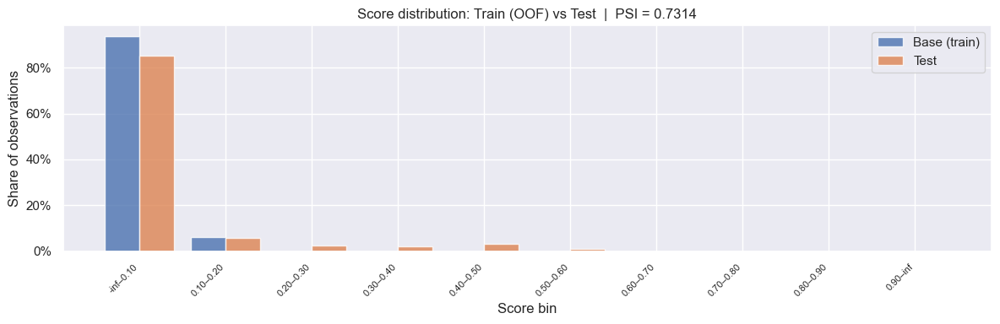

PSI Train vs Test:  0.7314


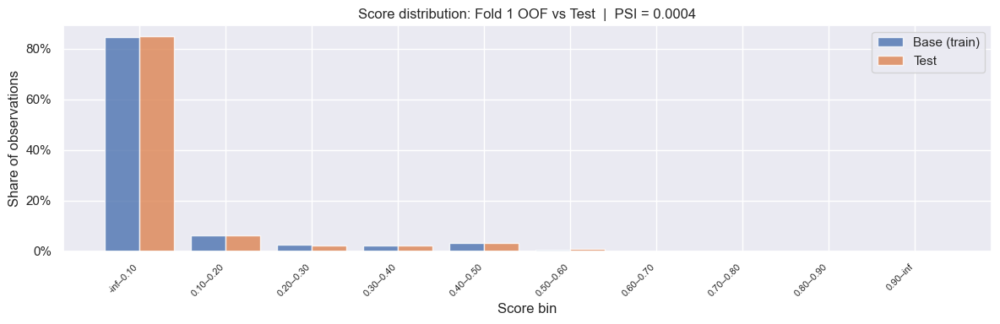

  Fold 1 PSI: 0.0004


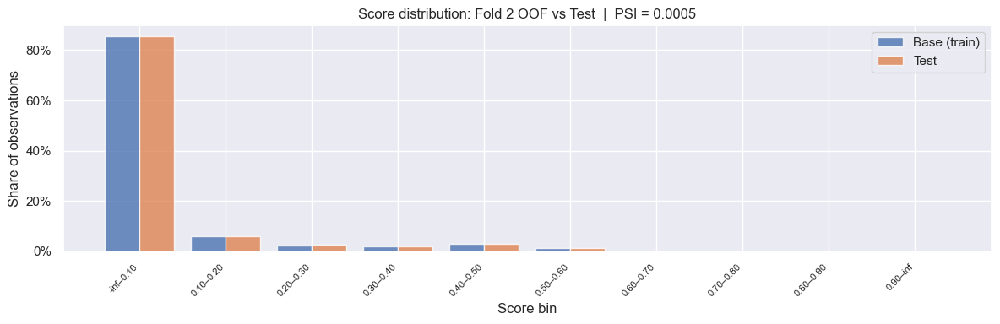

  Fold 2 PSI: 0.0005


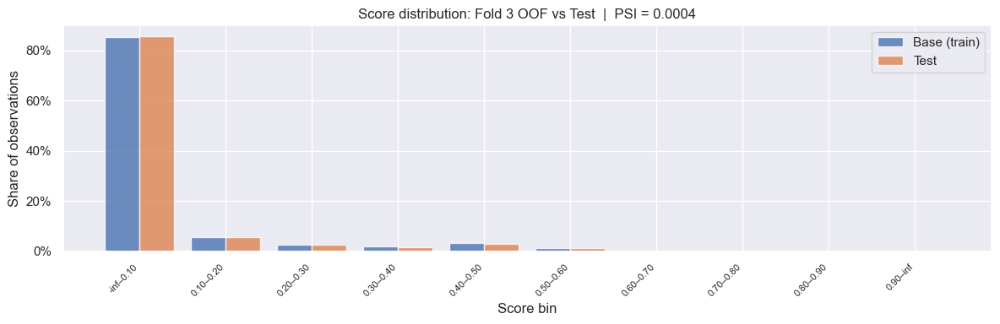

  Fold 3 PSI: 0.0004


In [24]:
# =============================================================================
# PSI on model score (Train vs Test  &  Train vs OOF)
#
# PSI measures how much the score distribution has shifted between two samples.
# Interpretation:
#   PSI < 0.10  — no significant shift, model is stable
#   PSI < 0.25  — minor shift, monitor
#   PSI >= 0.25 — major shift, model needs review
# =============================================================================

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

N_SCORE_BINS = 10  # number of equal-width score buckets for PSI calculation


def compute_score_psi(
    score_base: np.ndarray,
    score_test: np.ndarray,
    n_bins: int = N_SCORE_BINS,
    label: str = "",
) -> float:
    """
    Compute PSI between two score distributions.

    Bins are defined on `score_base`; `score_test` is mapped into the same bins.
    Small epsilon added to avoid log(0).
    """
    eps = 1e-6
    breakpoints = np.linspace(0, 1, n_bins + 1)
    breakpoints[0]  = -np.inf
    breakpoints[-1] =  np.inf

    base_counts = np.histogram(score_base, bins=breakpoints)[0]
    test_counts = np.histogram(score_test, bins=breakpoints)[0]

    base_pct = base_counts / base_counts.sum() + eps
    test_pct = test_counts / test_counts.sum() + eps

    psi_bins = (base_pct - test_pct) * np.log(base_pct / test_pct)
    psi_total = psi_bins.sum()

    # --- Plot distribution comparison ---
    bin_labels = [f"{breakpoints[i]:.2f}–{breakpoints[i+1]:.2f}" for i in range(n_bins)]
    x = np.arange(n_bins)
    width = 0.4

    fig, ax = plt.subplots(figsize=(12, 4))
    ax.bar(x - width / 2, base_pct, width, label="Base (train)", alpha=0.8, color="#4C72B0")
    ax.bar(x + width / 2, test_pct,  width, label="Test",        alpha=0.8, color="#DD8452")
    ax.set_xticks(x)
    ax.set_xticklabels(bin_labels, rotation=45, ha="right", fontsize=8)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
    ax.set_title(f"Score distribution: {label}  |  PSI = {psi_total:.4f}", fontsize=12)
    ax.set_xlabel("Score bin")
    ax.set_ylabel("Share of observations")
    ax.legend()
    plt.tight_layout()
    plt.show()

    return psi_total


# Use stacking final predictions on train (OOF mean) and test
psi_train_vs_test = compute_score_psi(
    score_base=oof_mean,
    score_test=final_test_pred,
    label="Train (OOF) vs Test",
)
print(f"PSI Train vs Test:  {psi_train_vs_test:.4f}")

# Per-fold PSI: compare each fold's OOF predictions (on val_idx rows only)
# against that fold's test predictions.
# Using fold_val_indices[fold_i] gives only the rows that were actually
# predicted OOF in that fold — avoids the zero-fill artefact.
for fold_i, val_idx_i in enumerate(fold_val_indices):
    oof_fold  = oof_level1[val_idx_i, fold_i]   # OOF predictions for this fold's val set
    test_fold = test_level1[:, fold_i]           # test predictions from this fold's model
    psi_fold  = compute_score_psi(oof_fold, test_fold, label=f"Fold {fold_i+1} OOF vs Test")
    print(f"  Fold {fold_i+1} PSI: {psi_fold:.4f}")

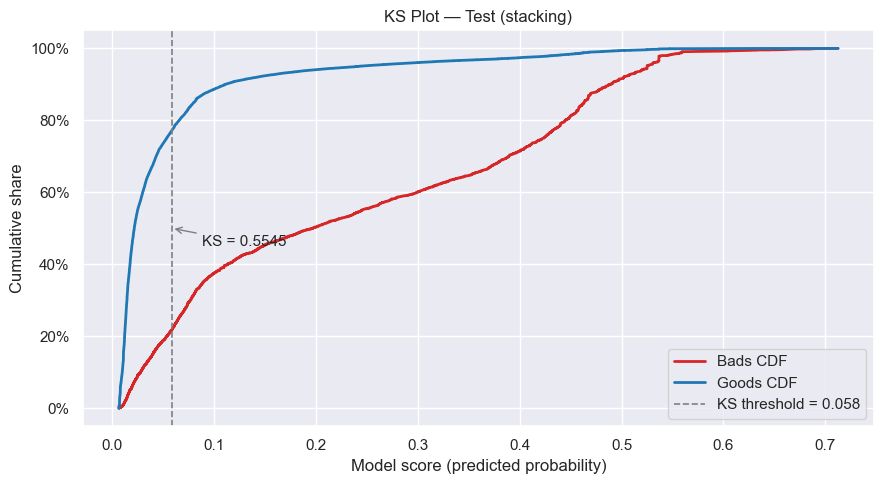

  KS = 0.5545  |  threshold = 0.0584


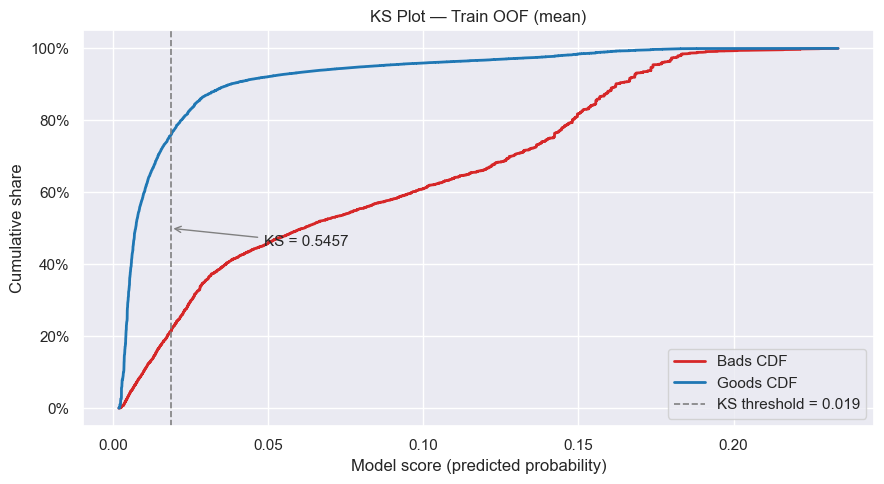

  KS = 0.5457  |  threshold = 0.0185


In [25]:
# =============================================================================
# KS statistic (Kolmogorov-Smirnov)
#
# KS measures the maximum separation between the cumulative distributions
# of scores for "good" (0) and "bad" (1) borrowers.
# In credit scoring, KS > 0.30 is considered acceptable, > 0.40 is good.
# =============================================================================

from scipy import stats


def compute_ks(y_true: pd.Series, y_score: np.ndarray, label: str = "") -> float:
    """
    Compute KS statistic and plot the CDF separation curve.
    Returns KS value and the score threshold at which separation is maximum.
    """
    df_ks = pd.DataFrame({"score": y_score, "target": y_true.values})
    df_ks = df_ks.sort_values("score").reset_index(drop=True)

    # Cumulative share of bads and goods at each threshold
    n_bad  = df_ks["target"].sum()
    n_good = len(df_ks) - n_bad

    df_ks["cum_bad"]  = df_ks["target"].cumsum() / n_bad
    df_ks["cum_good"] = (1 - df_ks["target"]).cumsum() / n_good
    df_ks["ks"]       = abs(df_ks["cum_bad"] - df_ks["cum_good"])

    ks_value     = df_ks["ks"].max()
    ks_threshold = df_ks.loc[df_ks["ks"].idxmax(), "score"]

    # --- Plot ---
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.plot(df_ks["score"], df_ks["cum_bad"],  label="Bads CDF",  color="#D62728", lw=2)
    ax.plot(df_ks["score"], df_ks["cum_good"], label="Goods CDF", color="#1F77B4", lw=2)
    ax.axvline(ks_threshold, color="gray", linestyle="--", lw=1.2,
               label=f"KS threshold = {ks_threshold:.3f}")
    ax.annotate(
        f"KS = {ks_value:.4f}",
        xy=(ks_threshold, 0.5),
        xytext=(ks_threshold + 0.03, 0.45),
        fontsize=11,
        arrowprops=dict(arrowstyle="->", color="gray"),
    )
    ax.set_title(f"KS Plot — {label}", fontsize=12)
    ax.set_xlabel("Model score (predicted probability)")
    ax.set_ylabel("Cumulative share")
    ax.legend()
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
    plt.tight_layout()
    plt.show()

    print(f"  KS = {ks_value:.4f}  |  threshold = {ks_threshold:.4f}")
    return ks_value


ks_test = compute_ks(y_test, final_test_pred, label="Test (stacking)")
ks_oof  = compute_ks(y_train, oof_mean,       label="Train OOF (mean)")

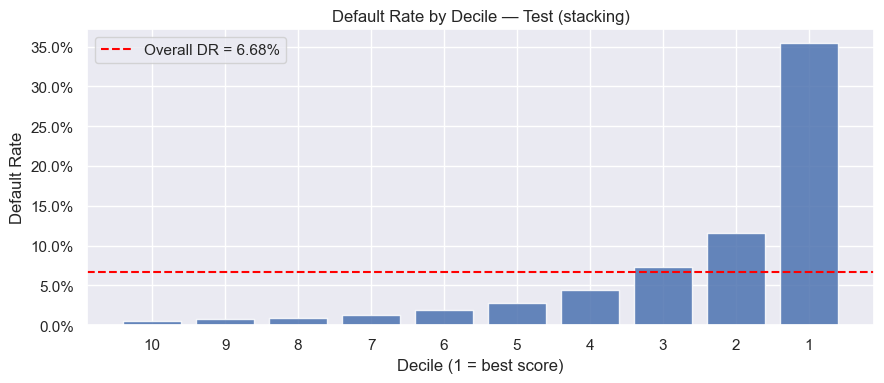

,decile,n_obs,n_bad,score_min,score_max,dr,pct_obs,cum_bad_pct,lift
0,10,4500,23,0.0066,0.0101,0.51%,10.00%,0.76%,0.08
1,9,4500,34,0.0101,0.0125,0.76%,10.00%,1.89%,0.11
2,8,4500,42,0.0125,0.0149,0.93%,10.00%,3.29%,0.14
3,7,4500,60,0.0149,0.0183,1.33%,10.00%,5.29%,0.20
4,6,4500,86,0.0183,0.0235,1.91%,10.00%,8.14%,0.29
5,5,4500,127,0.0235,0.0334,2.82%,10.00%,12.37%,0.42
6,4,4500,196,0.0334,0.0502,4.36%,10.00%,18.88%,0.65
7,3,4500,327,0.0503,0.0758,7.27%,10.00%,29.75%,1.09
8,2,4500,521,0.0758,0.1666,11.58%,10.00%,47.07%,1.73
9,1,4500,1592,0.1666,0.7124,35.38%,10.00%,100.00%,5.29


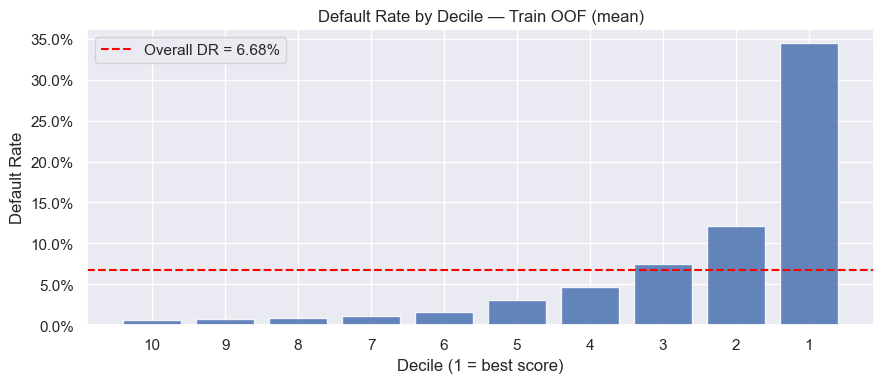

,decile,n_obs,n_bad,score_min,score_max,dr,pct_obs,cum_bad_pct,lift
0,10,10500,68,0.0018,0.0034,0.65%,10.00%,0.97%,0.10
1,9,10500,84,0.0034,0.0041,0.80%,10.00%,2.17%,0.12
2,8,10500,95,0.0041,0.0049,0.90%,10.00%,3.52%,0.14
3,7,10500,116,0.0049,0.0061,1.10%,10.00%,5.17%,0.17
4,6,10500,172,0.0061,0.0078,1.64%,10.00%,7.62%,0.25
5,5,10500,320,0.0078,0.0112,3.05%,10.00%,12.18%,0.46
6,4,10500,491,0.0112,0.0168,4.68%,10.00%,19.18%,0.70
7,3,10500,784,0.0168,0.0255,7.47%,10.00%,30.35%,1.12
8,2,10500,1273,0.0255,0.0569,12.12%,10.00%,48.49%,1.81
9,1,10500,3615,0.0569,0.2337,34.43%,10.00%,100.00%,5.15


In [26]:
# =============================================================================
# Decile table
#
# Standard credit scoring report: population is split into 10 equal score buckets
# (decile 1 = highest score = lowest risk).
# Shows: count, default rate, cumulative capture rate of bads, lift.
# =============================================================================

def decile_table(
    y_true: pd.Series,
    y_score: np.ndarray,
    label: str = "",
    n_deciles: int = 10,
) -> pd.DataFrame:
    """
    Build a decile analysis table and plot default rate by decile.

    Decile 1 = highest score (lowest predicted risk).
    """
    df_d = pd.DataFrame({"score": y_score, "target": np.array(y_true)})

    # Assign deciles: 1 = best score, n_deciles = worst score
    df_d["decile"] = pd.qcut(
        df_d["score"].rank(method="first"),
        q=n_deciles,
        labels=range(n_deciles, 0, -1),
    ).astype(int)

    total_bad = df_d["target"].sum()

    table = (
        df_d.groupby("decile", sort=False)
        .agg(
            n_obs     =("target", "count"),
            n_bad     =("target", "sum"),
            score_min =("score",  "min"),
            score_max =("score",  "max"),
        )
        .sort_index(ascending=False)  # decile 1 on top
        .reset_index()
    )

    table["dr"]          = table["n_bad"] / table["n_obs"]         # default rate in decile
    table["pct_obs"]     = table["n_obs"] / table["n_obs"].sum()   # share of population
    table["cum_bad_pct"] = table["n_bad"].cumsum() / total_bad     # cumulative bad capture
    table["lift"]        = table["dr"] / (total_bad / len(df_d))   # lift vs random

    # --- Plot default rate per decile ---
    fig, ax = plt.subplots(figsize=(9, 4))
    ax.bar(table["decile"].astype(str), table["dr"], color="#4C72B0", alpha=0.85)
    ax.axhline(total_bad / len(df_d), color="red", linestyle="--", lw=1.5,
               label=f"Overall DR = {total_bad/len(df_d):.2%}")
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
    ax.set_title(f"Default Rate by Decile — {label}", fontsize=12)
    ax.set_xlabel("Decile (1 = best score)")
    ax.set_ylabel("Default Rate")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # Format for display
    fmt = {
        "dr": "{:.2%}", "pct_obs": "{:.2%}",
        "cum_bad_pct": "{:.2%}", "lift": "{:.2f}",
        "score_min": "{:.4f}", "score_max": "{:.4f}",
    }
    display(table.style.format(fmt).set_caption(f"Decile Table — {label}"))

    return table


decile_test = decile_table(y_test,   final_test_pred, label="Test (stacking)")
decile_oof  = decile_table(y_train,  oof_mean,        label="Train OOF (mean)")

In [27]:
# =============================================================================
# VIF (Variance Inflation Factor)
#
# VIF quantifies multicollinearity: how much the variance of a coefficient
# is inflated due to correlation with other features.
# Rule of thumb:
#   VIF < 5   — acceptable
#   VIF 5–10  — moderate concern
#   VIF > 10  — severe multicollinearity, consider dropping the feature
#
# VIF is computed per fold inside the CV loop (saved in vif_per_fold).
# We aggregate by taking mean/std/min/max across folds — this gives a stable
# estimate not dependent on any single train split.
# =============================================================================

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Aggregate VIF across all folds
vif_all = pd.concat(vif_per_fold, ignore_index=True)
vif_df  = (
    vif_all.groupby("feature")["VIF"]
    .agg(VIF_mean="mean", VIF_std="std", VIF_min="min", VIF_max="max")
    .reset_index()
    .sort_values("VIF_mean", ascending=False)
    .reset_index(drop=True)
)

# Per-fold detail — useful to spot if one fold produces an outlier VIF
vif_pivot = vif_all.pivot(index="feature", columns="fold", values="VIF")
vif_pivot.columns = [f"fold_{i}" for i in vif_pivot.columns]
vif_pivot = vif_pivot.reset_index()

def _vif_color(val):
    if isinstance(val, float):
        if val > 10:
            return "background-color: #FFCCCC"   # red — severe
        elif val > 5:
            return "background-color: #FFF3CC"   # yellow — moderate
    return ""

print("Mean VIF across all folds:")
display(
    vif_df.style
    .applymap(_vif_color, subset=["VIF_mean"])
    .format({"VIF_mean": "{:.2f}", "VIF_std": "{:.2f}",
             "VIF_min": "{:.2f}", "VIF_max": "{:.2f}"})
    .set_caption("VIF — mean across all folds")
)

print("\nVIF per fold (to check consistency):")
fold_cols = [c for c in vif_pivot.columns if c.startswith("fold_")]
display(
    vif_pivot.style
    .applymap(_vif_color, subset=fold_cols)
    .format({c: "{:.2f}" for c in fold_cols})
    .set_caption("VIF — per fold breakdown")
)

high_vif = vif_df[vif_df["VIF_mean"] > 10]
if not high_vif.empty:
    print(f"\n[WARNING] {len(high_vif)} feature(s) with mean VIF > 10:")
    print(high_vif[["feature", "VIF_mean", "VIF_max"]].to_string(index=False))
else:
    print("\nAll features have mean VIF <= 10 across all folds — no multicollinearity.")

Mean VIF across all folds:


,feature,VIF_mean,VIF_std,VIF_min,VIF_max
0,LateIncomeRatio,1.56,nan,1.56,1.56
1,LatePerCredit,1.25,0.14,1.16,1.41
2,RevolvingUtilizationOfUnsecuredLines,1.23,0.00,1.23,1.23
3,DebtRatio,1.20,0.15,1.12,1.38
4,MonthlyIncome,1.16,0.00,1.16,1.17
5,age,1.13,0.01,1.13,1.14
6,NumberOfDependents,1.08,0.02,1.05,1.10
7,NumberRealEstateLoansOrLines,1.07,0.02,1.05,1.09



VIF per fold (to check consistency):


,feature,fold_0,fold_1,fold_2
0,DebtRatio,1.38,1.12,1.12
1,LateIncomeRatio,1.56,nan,nan
2,LatePerCredit,1.41,1.16,1.17
3,MonthlyIncome,nan,1.17,1.16
4,NumberOfDependents,1.05,1.10,1.09
5,NumberRealEstateLoansOrLines,1.05,1.09,1.08
6,RevolvingUtilizationOfUnsecuredLines,1.23,1.23,1.23
7,age,1.13,1.14,1.13



All features have mean VIF <= 10 across all folds — no multicollinearity.


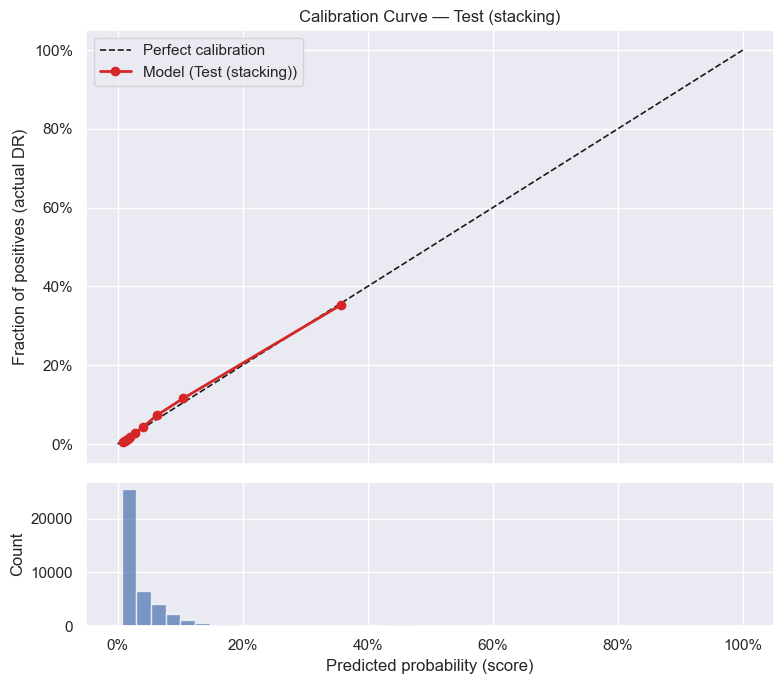

  Mean Calibration Error (MCE): 0.0044


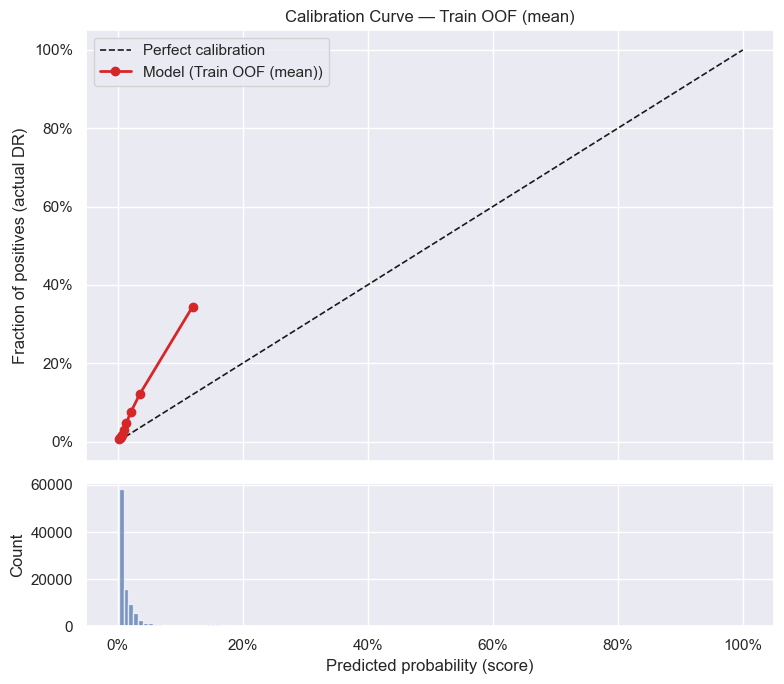

  Mean Calibration Error (MCE): 0.0446


In [ ]:
# =============================================================================
# Calibration curve
#
# Checks whether the predicted probabilities match observed default rates.
# A well-calibrated model's curve should follow the diagonal (predicted = actual).
# Deviation above diagonal = underestimates risk; below = overestimates risk.
# =============================================================================

from sklearn.calibration import calibration_curve

def plot_calibration(
    y_true: pd.Series,
    y_score: np.ndarray,
    label: str = "",
    n_bins: int = 10,
) -> None:
    """
    Plot calibration curve (reliability diagram) with a histogram of predicted scores.
    """
    fraction_of_positives, mean_predicted = calibration_curve(
        y_true, y_score, n_bins=n_bins, strategy="quantile"
    )

    fig, (ax1, ax2) = plt.subplots(
        2, 1, figsize=(8, 7), gridspec_kw={"height_ratios": [3, 1]}, sharex=True
    )

    # --- Reliability diagram ---
    ax1.plot([0, 1], [0, 1], "k--", lw=1.2, label="Perfect calibration")
    ax1.plot(mean_predicted, fraction_of_positives,
             "o-", color="#D62728", lw=2, ms=6, label=f"Model ({label})")
    ax1.set_ylabel("Fraction of positives (actual DR)")
    ax1.set_title(f"Calibration Curve — {label}", fontsize=12)
    ax1.legend()
    ax1.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
    ax1.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))

    # --- Score histogram below ---
    ax2.hist(y_score, bins=30, color="#4C72B0", alpha=0.7)
    ax2.set_xlabel("Predicted probability (score)")
    ax2.set_ylabel("Count")
    ax2.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))

    plt.tight_layout()
    plt.show()

    # Mean calibration error
    mce = np.mean(np.abs(fraction_of_positives - mean_predicted))
    print(f"  Mean Calibration Error (MCE): {mce:.4f}")


plot_calibration(y_test,  final_test_pred, label="Test (stacking)")
plot_calibration(y_train, oof_mean,        label="Train OOF (mean)")

,feature,fold_0,fold_1,fold_2,coef_mean,coef_std,coef_min,coef_max,n_folds_selected,sign_stable
0,intersept,-3.359914,-3.383880,-3.365542,-3.369779,0.012532,-3.383880,-3.359914,3,True
1,LatePerCredit,-0.682512,-0.700495,-0.704002,-0.695670,0.011529,-0.704002,-0.682512,3,True
2,RevolvingUtilizationOfUnsecuredLines,-0.628208,-0.653083,-0.626675,-0.635989,0.014824,-0.653083,-0.626675,3,True
3,age,-0.225510,-0.216930,-0.213615,-0.218685,0.006138,-0.225510,-0.213615,3,True
4,NumberRealEstateLoansOrLines,-0.170090,-0.168798,-0.163148,-0.167345,0.003692,-0.170090,-0.163148,3,True
5,DebtRatio,-0.145808,-0.161674,-0.138279,-0.148587,0.011942,-0.161674,-0.138279,3,True
6,MonthlyIncome,nan,-0.067095,-0.060990,-0.064043,0.004317,-0.067095,-0.060990,2,True
7,LateIncomeRatio,-0.056180,nan,nan,-0.056180,nan,-0.056180,-0.056180,1,True
8,NumberOfDependents,-0.035409,-0.042734,-0.051917,-0.043353,0.008272,-0.051917,-0.035409,3,True


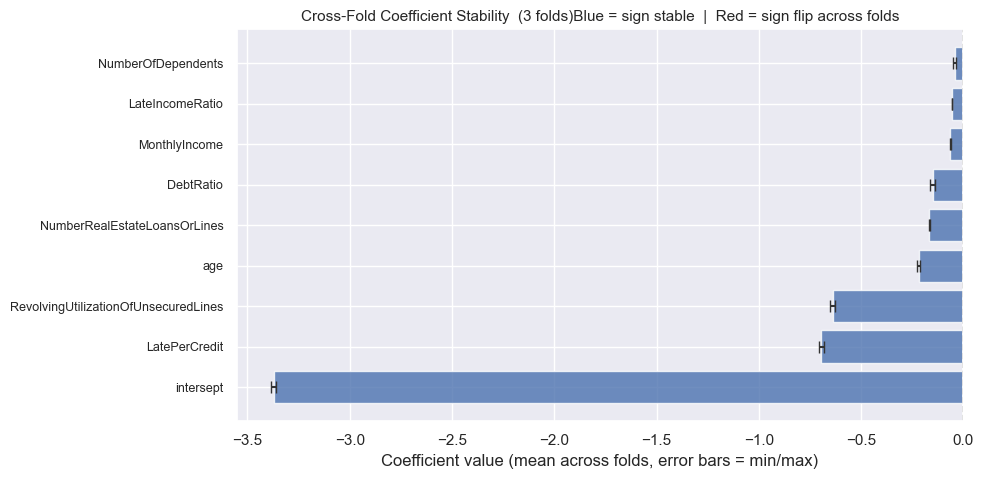

All coefficients have consistent sign across all 3 folds.

[INFO] 2 feature(s) not selected in every fold:
        feature  n_folds_selected
  MonthlyIncome                 2
LateIncomeRatio                 1


In [ ]:
# =============================================================================
# Cross-fold coefficient stability
#
# With N separate models (one per fold), bootstrap resampling on a single fold
# is less informative than looking at actual coefficient variation across folds.
#
# This cell aligns coefficients from all folds into a common feature space
# (NaN where a feature was not selected in a given fold), then computes:
#   - mean and std of each coefficient across folds
#   - 95% range: [min, max] across folds
#   - sign consistency flag: does the sign flip between any two folds?
#
# A coefficient with high std or sign flip across folds indicates that
# the feature selection is unstable and the feature should be reviewed.
# =============================================================================

# Align coefficients across folds into a single DataFrame
# Features not selected in a given fold get NaN (they were excluded by RFE/stepwise)
coef_df = pd.concat(coef_per_fold, axis=1).T.reset_index(drop=True)
coef_df.index = [f"fold_{i}" for i in range(N_FOLDS)]

# Transpose so rows = features, cols = folds
coef_stability = coef_df.T.copy()
coef_stability.columns = [f"fold_{i}" for i in range(N_FOLDS)]

fold_cols = coef_stability.columns.tolist()

coef_stability["coef_mean"] = coef_stability[fold_cols].mean(axis=1)
coef_stability["coef_std"]  = coef_stability[fold_cols].std(axis=1)
coef_stability["coef_min"]  = coef_stability[fold_cols].min(axis=1)
coef_stability["coef_max"]  = coef_stability[fold_cols].max(axis=1)
coef_stability["n_folds_selected"] = coef_stability[fold_cols].notna().sum(axis=1)

# Sign flip: True if all non-NaN values share the same sign
def _sign_stable(row):
    vals = row[fold_cols].dropna()
    if len(vals) < 2:
        return True   # only one fold — nothing to compare
    return (vals > 0).all() or (vals < 0).all()

coef_stability["sign_stable"] = coef_stability.apply(_sign_stable, axis=1)
coef_stability = coef_stability.sort_values("coef_mean").reset_index()
coef_stability = coef_stability.rename(columns={"index": "feature"})

# --- Display table ---
fmt_coef = {c: "{:.4f}" for c in ["coef_mean", "coef_std", "coef_min", "coef_max"]
            + fold_cols}

def _coef_color(val):
    return "" if val else "background-color: #FFCCCC"

def _selected_color(val):
    if val < N_FOLDS:
        return "background-color: #FFF3CC"   # yellow — not selected in all folds
    return ""

display(
    coef_stability.style
    .applymap(_coef_color,    subset=["sign_stable"])
    .applymap(_selected_color, subset=["n_folds_selected"])
    .format(fmt_coef, na_rep="—")
    .format({"n_folds_selected": "{:.0f}"})
    .set_caption(f"Coefficient Stability Across {N_FOLDS} Folds")
)

# --- Forest plot: mean ± std per feature across folds ---
features_plot = coef_stability["feature"].tolist()
y_pos         = np.arange(len(features_plot))
colors        = ["#4C72B0" if s else "#D62728"
                 for s in coef_stability["sign_stable"]]

fig, ax = plt.subplots(figsize=(10, max(4, len(features_plot) * 0.55)))

ax.barh(
    y_pos,
    coef_stability["coef_mean"],
    xerr=[
        coef_stability["coef_mean"] - coef_stability["coef_min"],
        coef_stability["coef_max"] - coef_stability["coef_mean"],
    ],
    align="center",
    color=colors,
    alpha=0.8,
    error_kw={"ecolor": "#333333", "capsize": 4, "lw": 1.5},
)

ax.axvline(0, color="black", linestyle="--", lw=1.2)
ax.set_yticks(y_pos)
ax.set_yticklabels(features_plot, fontsize=9)
ax.set_xlabel("Coefficient value (mean across folds, error bars = min/max)")
ax.set_title(
    f"Cross-Fold Coefficient Stability  ({N_FOLDS} folds)"
    "Blue = sign stable  |  Red = sign flip across folds",
    fontsize=11,
)
plt.tight_layout()
plt.show()

# Summary
unstable = coef_stability[~coef_stability["sign_stable"]]
not_always_selected = coef_stability[coef_stability["n_folds_selected"] < N_FOLDS]

if unstable.empty:
    print(f"All coefficients have consistent sign across all {N_FOLDS} folds.")
else:
    print(f"[WARNING] {len(unstable)} feature(s) with sign flip across folds:")
    print(unstable[["feature", "coef_min", "coef_max"]].to_string(index=False))

if not not_always_selected.empty:
    print(f"\n[INFO] {len(not_always_selected)} feature(s) not selected in every fold:")
    print(not_always_selected[["feature", "n_folds_selected"]].to_string(index=False))